# ibm-nd_eda_Accelerated Data Analysis_20241204.ipynb

* https://pypi.org/project/sweetviz/

* https://pypi.org/project/pandas-profiling/

# Install Libraries with [REBOOT]

In [ ]:
!pip install dask[dataframe]

INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 4.8 MB/s eta 0:00:00


In [ ]:
!pip install autogluon

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of openxlab to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of openxlab to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. 

# **[RESTART REQUIRED]**

# Reset Code Space

In [ ]:
# %reset -f

In [ ]:
%whos

Interactive namespace is empty.


# Global Configuration

In [ ]:
# CONFIGURE: library installation and importation

# Set EDA Flag for sweetviz ydata-profiling autoviz
FLAG_EDA = True

# Set AUTOML Flag for
FLAG_AUTOML = False

# Questions:

* Predict dependent var: 2002-2005 arrest vs convictions
* What is the human/cop prediction 'recidivism' (== 'arrestedafter2002')?
* educ02 is mostly empty/NaN, does this mean 'Unknown' or 'None'
* expectdeath is mostly '-4' means 'Unknown'
* parentrelationships: what do -1,-2,-4 values mean

# Data Dictionary

I'll create a concise summary of the data dictionary, organizing the variables by their categories while maintaining a clear structure. Let me provide this in a business-appropriate format.

## NLSY97 Dataset Overview

### Demographics
- **Sex**: Binary gender recorded in 1997
- **Birth Year**: Recorded birth year (1980-1984)
- **Race/Ethnicity**: Two classifications:
  1. Broad categories: Black, Hispanic, Mixed non-Hispanic, Non-black/non-Hispanic
  2. Specific categories: White, Black/African American, American Indian/Eskimo/Aleut, Asian/Pacific Islander, Other

### Physical Characteristics
- **Height**: Recorded in feet and inches (2002)
- **Weight**: Recorded in pounds (2002)

### Social Status
- **Marital Status**: Categories including never married, cohabiting, married with/without spouse, separated, widowed (2002)
- **Education**: Highest degree received by 2002/2003 (none through PhD)
- **College Enrollment**: Enrollment status in 2002
- **Work Experience**: Total employee-type jobs held in 2002

### Childhood Background
- **Household Size**: Number of members in 1997
- **Parent Relations**: Type of guardianship at age 12
- **Urban/Rural**: Residential area type at age 12

### Adverse Life Events
- **Homelessness**: Experience in last 5 years (2+ nights)
- **Family Incarceration**: Adult household member imprisonment in last 5 years
- **Food Stamps**: Receipt during 2002
- **Crime Victimization**: Violent crime experience in last 5 years

### Religious Views
- **Religious Decision-Making**: Binary indicator of seeking divine guidance
- **Religious Belief**: Binary indicator of belief in divine intervention

### Health Indicators
- **Mortality Expectation**: Self-reported death probability for next year
- **Depression**: Monthly frequency of severe depression
- **Substance Use**: Binary indicators for:
  1. Marijuana use (1999-2002)
  2. Hard drug use (1999-2002)
  3. Any drug use (1999-2002)

### Criminal History
- **Arrests**: Binary indicators and counts for:
  1. Pre-2002 arrests
  2. 2002-2005 arrests
- **Convictions**: Binary indicators for:
  1. Pre-2002 convictions
  2. 2002-2005 convictions

Note: Missing values are coded as: Valid skip (-4), Invalid skip (-3), Don't know (-2), Refusal (-1). Some 2002 missing values were updated using 2001/2007 data where appropriate.

# Install Libraries

In [ ]:
# Conditionally install EDA Libraries

if FLAG_EDA:
    print("Installing required libraries...")
    !pip install sweetviz ydata-profiling autoviz
else:
    print("Skipping library installation.")

Installing required libraries...
  Using cached sweetviz-2.3.1-py3-none-any.whl.metadata (24 kB)
  Using cached ydata_profiling-4.12.1-py2.py3-none-any.whl.metadata (20 kB)
  Using cached autoviz-0.1.905-py3-none-any.whl.metadata (14 kB)
  Using cached visions-0.7.6-py3-none-any.whl.metadata (11 kB)
  Using cached htmlmin-0.1.12.tar.gz (19 kB)
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 45.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.5/67.5 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.9/161.9 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.9/25

In [ ]:
# !pip install seaborn

In [ ]:
# !pip install sweetviz

In [ ]:
# !pip install -U pandas-profiling # Old version
# !pip install ydata-profiling # New version

In [ ]:
# !pip install autoviz

In [ ]:
!pip list | grep 'pandas'

geopandas                          1.0.1
pandas                             2.2.2
pandas-datareader                  0.10.0
pandas-dq                          1.29
pandas-gbq                         0.25.0
pandas-stubs                       2.2.2.240909
sklearn-pandas                     2.2.0


# Import Libraries

In [ ]:
# prompt: colab command to enable multiple outputs per code cell

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


In [ ]:
from IPython.display import HTML

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from google.colab import files

In [ ]:
import io
import numpy as np
import pandas as pd

import re
import json
from pathlib import Path
from pprint import pprint

import time
from datetime import datetime
import logging

from typing import List, Dict, Any, Union, Optional

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from scipy.stats import chi2_contingency

In [ ]:
if FLAG_EDA == True:
  import sweetviz as sv
  # from pandas_profiling import ProfileReport
  from ydata_profiling import ProfileReport
  from autoviz.AutoViz_Class import AutoViz_Class

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


# Functions

In [ ]:
# prompt: write fn get_data_upload() that popup an upload dialog box in Colab, validates the uploaded file is *.csv (if not exit with error) and then reads into a Pandas Dataframe that is returned from the function

def get_data_upload():
  uploaded = files.upload()
  for fn in uploaded.keys():
    if not fn.endswith('.csv'):
      print('Error: Uploaded file must be a CSV file.')
      return None
    try:
      df = pd.read_csv(io.BytesIO(uploaded[fn]))
      return df
    except pd.errors.ParserError:
      print("Error: Could not parse the CSV file.")
      return None

In [ ]:
def get_metadata_dict(df, indent=4):
    def format_inner_dict(col):
        nunique = df[col].nunique()
        dtype = str(df[col].dtype)

        inner = " " * (indent + 4) + f'"value": {nunique}\n'
        inner += " " * (indent + 4) + '"renamed": ""\n'
        inner += " " * (indent + 4) + f'"type": "{dtype}"\n'
        inner += " " * (indent + 4) + '"feature": "numeric"'
        return inner

    output = "{\n"

    for col in df.columns:
        output += " " * indent + f'"{col}": {{\n'
        output += format_inner_dict(col) + "\n"
        output += " " * indent + "}"
        if col != df.columns[-1]:  # Add comma if not last item
            output += ","
        output += "\n"

    output += "}"
    return output

# Example usage:
# df = pd.DataFrame(...)
# print(get_metadata_dict(df))

In [ ]:
def print_dict(dictionary, indent=4, initial_indent=0):
    output = " " * initial_indent + "{\n"

    for key, value in dictionary.items():
        if isinstance(value, dict):
            output += " " * indent + f'"{key}": {{\n'
            output += print_dict(value, indent + 4, 0)
            output += " " * indent + "}\n"
        else:
            if value is None or value == "":
                output += " " * indent + f'"{key}": ""\n'
            elif isinstance(value, str):
                output += " " * indent + f'"{key}": "{value}"\n'
            else:
                output += " " * indent + f'"{key}": {value}\n'

    output += " " * initial_indent + "}"
    return output

# Example usage:
sample_dict = {
    "name": "John",
    "age": 30,
    "address": {
        "street": "123 Main St",
        "city": "Boston",
        "zip": "",
        "unit": None
    },
    "email": ""
}

print(print_dict(sample_dict))

{
    "name": "John"
    "age": 30
    "address": {
{
        "street": "123 Main St"
        "city": "Boston"
        "zip": ""
        "unit": ""
}    }
    "email": ""
}


In [ ]:
def compare_columns(df, col_ls=["weight", "num_weight"]):
    """Compares the values between two columns in a DataFrame.

    Args:
        df: A pandas DataFrame.
        col_ls: List of two column names to compare. Defaults to ["weight", "num_weight"].

    Returns:
        A pandas DataFrame showing the comparison and difference, or None if columns not found.
    """
    # Validate input
    if len(col_ls) != 2:
        print("Error: Exactly two columns must be provided for comparison.")
        return None

    col1, col2 = col_ls
    if col1 not in df.columns or col2 not in df.columns:
        print(f"Error: Column '{col1}' or '{col2}' not found in DataFrame.")
        return None

    # Create base comparison with columns and equality check
    comparison_df = pd.DataFrame({
        col1: df[col1],
        col2: df[col2],
        'equal': df[col1] == df[col2]
    })

    # Only calculate difference if both columns are numeric
    if pd.api.types.is_numeric_dtype(df[col1]) and pd.api.types.is_numeric_dtype(df[col2]):
        comparison_df['difference'] = df[col1] - df[col2]
    else:
        comparison_df['difference'] = 'N/A (non-numeric comparison)'

    return comparison_df

# Example usage:
# comparison_result = compare_columns(df)
# if comparison_result is not None:
#     print(comparison_result)

In [ ]:
def df_col_unique_vals(df, col_skip_ls=['long', 'short'], col_neg_valid_ls=[]):
   """
   Print unique values and counts for each column, skipping specified columns.
   Shows full value counts table, missing value counts, and negative value counts
   (except for columns in col_neg_valid_ls).

   Args:
       df: pandas DataFrame to analyze
       col_skip_ls: list of columns to skip (default: ['long', 'short'])
       col_neg_valid_ls: list of columns where negative values are valid
   """
   for column_name in df.columns:
       # Skip specified columns
       if column_name in col_skip_ls:
           continue

       # Print header with column name and dtype
       print(f"\n\n============================== COLUMN: {column_name} DTYPE: {df[column_name].dtype} ==============================")

       # Get unique values, handle mixed types
       try:
           unique_vals = sorted(df[column_name].unique())
       except TypeError:
           # If sorting fails, get unsorted unique values
           unique_vals = df[column_name].unique()
           # Filter out nan values for display
           unique_vals = [x for x in unique_vals if pd.notna(x)]

       print("\nUnique values:", unique_vals)

       # Print value counts table
       print("\nValue counts:")
       value_counts = df[column_name].value_counts(dropna=False)
       for val, count in value_counts.items():
           # Handle NaN/None display
           if pd.isna(val):
               val_str = "NaN/Null"
           else:
               val_str = str(val)
           print(f"    {val_str:30} {count:5d}")

       # Always print summary counts
       print("\nSummary counts:")
       nan_count = df[column_name].isna().sum()
       print(f"    NaN/Null count: {nan_count}")

       # For object/string columns, check for None and Unknown
       if df[column_name].dtype == 'object':
           # Count 'None' values (case insensitive)
           none_mask = df[column_name].fillna('').astype(str).str.lower().eq('none')
           none_count = none_mask.sum()
           print(f"    'None' count: {none_count}")

           # Count 'Unknown' values (case insensitive)
           unknown_mask = df[column_name].fillna('').astype(str).str.lower().eq('unknown')
           unknown_count = unknown_mask.sum()
           print(f"    'Unknown' count: {unknown_count}")

       # Check for negative values if not in valid list
       if column_name not in col_neg_valid_ls:
           # Convert to string to catch both numeric and string negatives
           col_str = df[column_name].fillna('').astype(str)

           # Count specific negative values
           neg_one_count = col_str.eq('-1').sum()
           neg_two_count = col_str.eq('-2').sum()
           neg_four_count = col_str.eq('-4').sum()

           # Only print negative section if any negative values found
           if neg_one_count > 0 or neg_two_count > 0 or neg_four_count > 0:
               print("\nNegative value counts:")
               print(f"    '-1' count: {neg_one_count}")
               print(f"    '-2' count: {neg_two_count}")
               print(f"    '-4' count: {neg_four_count}")

# Import Data

In [ ]:
DATA_TEST = False

if DATA_TEST == True:
  df = pd.read_csv("http://www.creditriskanalytics.net/uploads/1/9/5/1/19511601/hmeq.csv")
else:
  df = get_data_upload()



Saving vignettes.csv to vignettes.csv


In [ ]:
# BACKUP: Original Raw df

original_raw_df = df.copy(deep=True)
original_raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   pubid                  1412 non-null   object 
 1   sex                    1412 non-null   object 
 2   birthyear              1412 non-null   int64  
 3   birthmonth             1412 non-null   object 
 4   race_ethnicity         1412 non-null   object 
 5   race_specific          1412 non-null   object 
 6   height_ft              1412 non-null   int64  
 7   height_in              1412 non-null   int64  
 8   weight                 1412 non-null   object 
 9   married02              1412 non-null   object 
 10  educ02                 802 non-null    object 
 11  college02              1412 non-null   object 
 12  experience02           1412 non-null   int64  
 13  hhsize97               1412 non-null   int64  
 14  parentrelations        1412 non-null   object 
 15  urba

# Null and NaN and Negative Values

In [ ]:
# prompt: compare what the percent of exact equality between two columns with function percent_equal_cols{df[[col1, col2]]) that returns an int 0-100 % for the percent of rows in exactly equality

def percent_equal_cols(df, col_ls):
    """
    Calculates the percentage of rows where two columns have exactly equal values.

    Args:
        df: The input DataFrame.
        col_ls: A list containing the names of the two columns to compare.

    Returns:
        An integer representing the percentage of rows with equal values (0-100).
        Returns an error message if the columns are not found or if the input is invalid.
    """
    if not isinstance(df, pd.DataFrame):
        return "Error: Input 'df' must be a pandas DataFrame."

    if not isinstance(col_ls, list) or len(col_ls) != 2:
        return "Error: 'col_ls' must be a list of two column names."

    col1, col2 = col_ls
    if col1 not in df.columns or col2 not in df.columns:
        return f"Error: Columns '{col1}' or '{col2}' not found in DataFrame."

    num_equal = (df[col1] == df[col2]).sum()
    total_rows = len(df)

    if total_rows == 0:
        return 0  # Handle empty DataFrame case

    return int((num_equal / total_rows) * 100)

# Example usage (assuming you have a DataFrame named 'df'):
# percentage = percent_equal_cols(df, ['col1', 'col2'])
# print(f"Percentage of equal rows: {percentage}%")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   pubid                  1412 non-null   object 
 1   sex                    1412 non-null   object 
 2   birthyear              1412 non-null   int64  
 3   birthmonth             1412 non-null   object 
 4   race_ethnicity         1412 non-null   object 
 5   race_specific          1412 non-null   object 
 6   height_ft              1412 non-null   int64  
 7   height_in              1412 non-null   int64  
 8   weight                 1412 non-null   object 
 9   married02              1412 non-null   object 
 10  educ02                 802 non-null    object 
 11  college02              1412 non-null   object 
 12  experience02           1412 non-null   int64  
 13  hhsize97               1412 non-null   int64  
 14  parentrelations        1412 non-null   object 
 15  urba

In [ ]:
# Example usage (assuming you have a DataFrame named 'df'):
percentage = percent_equal_cols(df, ['recidivism', 'arrestedafter2002'])
print(f"Percentage of identical rows: {percentage}%")

Percentage of identical rows: 100%


In [ ]:
df['recidivism'].value_counts()

,count
recidivism,
0,1019
1,393


In [ ]:
df['arrestedafter2002'].value_counts()

,count
arrestedafter2002,
0,1019
1,393


In [ ]:
'''
def df_col_unique_vals(df, col_skip_ls=['long', 'short'], col_neg_valid_ls=[]):
   """
   Print unique values and counts for each column, skipping specified columns.
   Shows full value counts table, missing value counts, and negative value counts
   (except for columns in col_neg_valid_ls).

   Args:
       df: pandas DataFrame to analyze
       col_skip_ls: list of columns to skip (default: ['long', 'short'])
       col_neg_valid_ls: list of columns where negative values are valid
   """
   for column_name in df.columns:
       # Skip specified columns
       if column_name in col_skip_ls:
           continue

       # Print header with column name and dtype
       print(f"\n\n============================== COLUMN: {column_name} DTYPE: {df[column_name].dtype} ==============================")

       # Get unique values, handle mixed types
       try:
           unique_vals = sorted(df[column_name].unique())
       except TypeError:
           # If sorting fails, get unsorted unique values
           unique_vals = df[column_name].unique()
           # Filter out nan values for display
           unique_vals = [x for x in unique_vals if pd.notna(x)]

       print("\nUnique values:", unique_vals)

       # Print value counts table
       print("\nValue counts:")
       value_counts = df[column_name].value_counts(dropna=False)
       for val, count in value_counts.items():
           # Handle NaN/None display
           if pd.isna(val):
               val_str = "NaN/Null"
           else:
               val_str = str(val)
           print(f"    {val_str:30} {count:5d}")

       # Always print summary counts
       print("\nSummary counts:")
       nan_count = df[column_name].isna().sum()
       print(f"    NaN/Null count: {nan_count}")

       # For object/string columns, check for None and Unknown
       if df[column_name].dtype == 'object':
           # Count 'None' values (case insensitive)
           none_mask = df[column_name].fillna('').astype(str).str.lower().eq('none')
           none_count = none_mask.sum()
           print(f"    'None' count: {none_count}")

           # Count 'Unknown' values (case insensitive)
           unknown_mask = df[column_name].fillna('').astype(str).str.lower().eq('unknown')
           unknown_count = unknown_mask.sum()
           print(f"    'Unknown' count: {unknown_count}")

       # Check for negative values if not in valid list
       if column_name not in col_neg_valid_ls:
           # Convert to string to catch both numeric and string negatives
           col_str = df[column_name].fillna('').astype(str)

           # Count specific negative values
           neg_one_count = col_str.eq('-1').sum()
           neg_two_count = col_str.eq('-2').sum()
           neg_four_count = col_str.eq('-4').sum()

           # Only print negative section if any negative values found
           if neg_one_count > 0 or neg_two_count > 0 or neg_four_count > 0:
               print("\nNegative value counts:")
               print(f"    '-1' count: {neg_one_count}")
               print(f"    '-2' count: {neg_two_count}")
               print(f"    '-4' count: {neg_four_count}")
''';

In [ ]:
# Example with parentrelations as valid negative column
df_col_unique_vals(original_raw_df, col_skip_ls = ['long','short','pubid','weight','num_weight'], col_neg_valid_ls=[])
# df_col_unique_vals(df, col_skip_ls = ['long','short','pubid','weight','num_weight'], col_neg_valid_ls=[])


# Or checking all columns for negatives
# df_col_unique_vals(original_raw_df)



============================== COLUMN: sex DTYPE: object ==============================

Unique values: ['Female', 'Male']

Value counts:
    Male                            1014
    Female                           398

Summary counts:
    NaN/Null count: 0
    'None' count: 0
    'Unknown' count: 0


============================== COLUMN: birthyear DTYPE: int64 ==============================

Unique values: [1980, 1981, 1982, 1983, 1984]

Value counts:
    1981                             297
    1982                             293
    1983                             292
    1984                             271
    1980                             259

Summary counts:
    NaN/Null count: 0


============================== COLUMN: birthmonth DTYPE: object ==============================

Unique values: ['10: October', '11: November', '12: December', '1: January', '2: February', '3: March', '4: April', '5: May', '6: June', '7: July', '8: August', '9: September']

Value counts:
    8

# Clean DataFrame Metadata

## Edit Metadata

In [ ]:
print(get_metadata_dict(df))

{
    "pubid": {
        "value": 1412
        "renamed": ""
        "type": "object"
        "feature": "numeric"
    },
    "sex": {
        "value": 2
        "renamed": ""
        "type": "object"
        "feature": "numeric"
    },
    "birthyear": {
        "value": 5
        "renamed": ""
        "type": "int64"
        "feature": "numeric"
    },
    "birthmonth": {
        "value": 12
        "renamed": ""
        "type": "object"
        "feature": "numeric"
    },
    "race_ethnicity": {
        "value": 4
        "renamed": ""
        "type": "object"
        "feature": "numeric"
    },
    "race_specific": {
        "value": 6
        "renamed": ""
        "type": "object"
        "feature": "numeric"
    },
    "height_ft": {
        "value": 6
        "renamed": ""
        "type": "int64"
        "feature": "numeric"
    },
    "height_in": {
        "value": 13
        "renamed": ""
        "type": "int64"
        "feature": "numeric"
    },
    "weight": {
        "val

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   pubid                  1412 non-null   object 
 1   sex                    1412 non-null   object 
 2   birthyear              1412 non-null   int64  
 3   birthmonth             1412 non-null   object 
 4   race_ethnicity         1412 non-null   object 
 5   race_specific          1412 non-null   object 
 6   height_ft              1412 non-null   int64  
 7   height_in              1412 non-null   int64  
 8   weight                 1412 non-null   object 
 9   married02              1412 non-null   object 
 10  educ02                 802 non-null    object 
 11  college02              1412 non-null   object 
 12  experience02           1412 non-null   int64  
 13  hhsize97               1412 non-null   int64  
 14  parentrelations        1412 non-null   object 
 15  urba

### CONFIGURE metadata_dt

In [ ]:
# CONFIGURE: Manually rename, feature, type the columns for maximum clarity

# if renamed == "DROP" then DELETE
# if renamed == "TARGET" save in y_label then DELETE
# if feature == "binary" cast str/num to True/False
# if feature == "nominal category" then normalize labels

metadata_dt = {
    "pubid": {
        "value": 1412,
        "renamed": "DROP",
        "type": "int64",
        "class": "demographic",
        "feature": "discrete_numeric",
    },
    # DEMOGRAPHICS
    "sex": {
        "value": 2,
        "renamed": "sex_recorded_in_1997",
        "type": "str",
        "class": "demographic",
        "feature": "nominal_category",
    },
    "age": {
        "value": 5,
        "renamed": "age",
        "type": "int64",
        "class": "demographic",
        "feature": "discrete_numeric",
    },
    "height_total_inches": {
        "value": 33,
        "renamed": "height_total_inches",
        "type": "int64",
        "class": "demographic",
        "feature": "discrete_numeric",
    },
    "num_weight": {
        "value": 144,
        "renamed": "weight_in_lbs",
        "type": "int",
        "class": "demographic",
        "feature": "discrete_numeric",
    },
    "race": {
        "value": 6,
        "renamed": "race",
        "type": "str",
        "class": "demographic",
        "feature": "nominal_category",
    },
    "married02": {
        "value": 8,
        "renamed": "marriage_or_cohabitation_status_in_2002",
        "type": "str",
        "class": "demographic",
        "feature": "nominal_category",
    },
    # EDUCATION AND WORK
    "educ02": {
        "value": 4,
        "renamed": "highest_degree_by_2002",
        "type": "str",
        "class": "education_and_work",
        "feature": "ordinal_category",
    },
    "college02": {
        "value": 10,
        "renamed": "college_enrollment_status_in_2002",
        "type": "str",
        "class": "education_and_work",
        "feature": "ordinal_category",
    },
    "experience02": {
        "value": 9,
        "renamed": "jobs_held_in_2002",
        "type": "int64",
        "class": "education_and_work",
        "feature": "discrete_numeric",
    },
    # CHILDHOOD
    "hhsize97": {
        "value": 11,
        "renamed": "household_size_in_1997",
        "type": "int64",
        "class": "childhood",
        "feature": "discrete_numeric",
    },
    "parentrelations": {
        "value": 13,
        "renamed": "parent_or_guardian_relationship_at_age_12",
        "type": "str",
        "class": "childhood",
        "feature": "nominal_category",
    },
    "urbanrural": {
        "value": 5,
        "renamed": "raised_in_urban_or_rural_area",
        "type": "str",
        "class": "childhood",
        "feature": "nominal_category",
    },
    # STRESSORS
    "homelessness": {
        "value": 2,
        "renamed": "homeless_for_2+_nights_over_last_5_years",
        "type": "binary",
        "class": "stressors",
        "feature": "binary", # NO/YES
    },
    "faminjail": {
        "value": 2,
        "renamed": "any_adult_household_member_jailed_in_last_5_years",
        "type": "binary",
        "class": "stressors",
        "feature": "binary", # NO/YES
    },
    "foodstamp": {
        "value": 2,
        "renamed": "recieved_food_stamps_in_2002",
        "type": "binary",
        "class": "stressors",
        "feature": "binary", # 0/1
    },
    "victim": {
        "value": 3,
        "renamed": "victim_of_violent_crime_in_last_5_years",
        "type": "str",
        "class": "stressors",
        "feature": "binary", # NO/YES
    },
    # RELIGIOUS BELIEFS
    "askgod": {
        "value": 4,
        "renamed": "i_often_prey_to_god_for_help",
        "type": "str",
        "class": "religious_beliefs",
        "feature": "binary", # TRUE/FALSE
    },
    "godhasnothingtodo": {
        "value": 4,
        "renamed": "god_has_nothing_to_do_with_me_personally",
        "type": "str",
        "class": "religious_beliefs",
        "feature": "binary", # TRUE/FALSE
    },
    # MENTAL HEALTH
    "expectdeath": {
        "value": 25,
        "renamed": "percent_expect_death_in_next_5_years",
        "type": "str",
        "class": "mental_health",
        "feature": "discrete_numeric", # percent 0-100
    },
    "depression": {
        "value": 4,
        "renamed": "how_much_time_in_last_month_when_nothing_cheers_you_up",
        "type": "str",
        "class": "mental_health",
        "feature": "nominal_category", # None/Some..
    },
    # SUBSTANCE ABUSE
    "marijuana": {
        "value": 2,
        "renamed": "used_marijuana_in_last_4_years",
        "type": "binary",
        "class": "substance_abuse",
        "feature": "binary", # 0/1
    },
    "cocaine": {
        "value": 2,
        "renamed": "used_cocaine_or_other_hard_drug_in_last_4_years",
        "type": "binary",
        "class": "substance_abuse",
        "feature": "binary", # 0/1
    },
    "anydrug": {
        "value": 2,
        "renamed": "used_any_drug_in_last_4_years",
        "type": "binary",
        "class": "substance_abuse",
        "feature": "binary", # 0/1
    },
    # ARREST RECORD
    "arrestedby2002": {
        "value": 1,
        "renamed": "ever_arrested_in_last_5_years",
        "type": "binary",
        "class": "arrest_record",
        "feature": "binary", # 0/1
    },
    "numberofarrestsby2002": {
        "value": 17,
        "renamed": "number_of_arrests_in_last_5_years",
        "type": "int",
        "class": "arrest_record",
        "feature": "discrete_numeric", # 0/1
    },
    "convictedby2002": {
        "value": 2,
        "renamed": "ever_convicted_in_last_5_years",
        "type": "binary",
        "class": "arrest_record",
        "feature": "binary", # 0/1
    },
    # TEXT SUMMARY
    "short": {
        "value": 342,
        "renamed": "short_text_summary",
        "type": "str",
        "class": "text_summary",
        "feature": "text",
    },
    "long": {
        "value": 1412,
        "renamed": "long_text_summary",
        "type": "str",
        "class": "text_summary",
        "feature": "text",
    },
    # RESPONSE VARIABLES
    "arrestedafter2002": {
        "value": 2,
        "renamed": "TARGET",
        "type": "binary",
        "class": "response_variables",
        "feature": "binary", # 0/1
    },
    "convictedafter2002": {
        "value": 2,
        "renamed": "TARGET",
        "type": "int64",
        "class": "response_variables",
        "feature": "binary", # 0/1
    },
}

## Fix Invalid Data

### INT expectdeath: "" to None

In [ ]:
# Before
df['expectdeath'].unique()
df['expectdeath'] = df['expectdeath'].replace('', None)

# After
df['expectdeath'].unique()

array(['-4', '0: 0%', '50', '1 TO 10: 1%-10%', '5', '25', '75', '2', '10',
       '8', '40', '65', '-2', '7', '3', '48', '20', '23', '30', '-1',
       '15', '85', '100', '4', '80'], dtype=object)

array(['-4', '0: 0%', '50', '1 TO 10: 1%-10%', '5', '25', '75', '2', '10',
       '8', '40', '65', '-2', '7', '3', '48', '20', '23', '30', '-1',
       '15', '85', '100', '4', '80'], dtype=object)

## Transform and Aggregate Columns

### num_weight OVER weight

In [ ]:
# Custom column comparison
comparison_result = compare_columns(df, col_ls=["weight", "num_weight"])

if comparison_result is not None:
    print(comparison_result)
else:
    print("Comparison could not be performed.")

        weight    num_weight  equal           difference         
0     150 TO 174     162.0    False  N/A (non-numeric comparison)
1     125 TO 149     137.0    False  N/A (non-numeric comparison)
2     175 TO 199     187.0    False  N/A (non-numeric comparison)
3            180     180.0    False  N/A (non-numeric comparison)
4            140     140.0    False  N/A (non-numeric comparison)
...          ...         ...    ...                           ...
1407         105     105.0    False  N/A (non-numeric comparison)
1408         215     215.0    False  N/A (non-numeric comparison)
1409         185     185.0    False  N/A (non-numeric comparison)
1410         255     255.0    False  N/A (non-numeric comparison)
1411         190     190.0    False  N/A (non-numeric comparison)

[1412 rows x 4 columns]


In [ ]:
try:
  df.drop(columns=["weight"], inplace=True)
except:
  pass

df.shape

(1412, 37)

### birthyear TO age

In [ ]:
# prompt: try to convert "df['age'] = 2022 - df['birthyear']" but if fail catch and set to np.nan

def convert_birthyear_to_age(df):
  try:
    df['age'] = 2022 - df['birthyear']
  except (KeyError, TypeError):
    df['age'] = np.nan
  return df

df = convert_birthyear_to_age(df)

In [ ]:
try:
  df.drop(columns=["birthyear","birthmonth"], inplace=True)
except:
  pass

df.shape

(1412, 36)

### height_ft AND height_in TO height_total_inches

In [ ]:
# prompt: write a function to try to convert height_ft and height_in to df["height_total_inches"] else catch error and set to np.nan

def convert_height(df):
    try:
        df["height_total_inches"] = (df["height_ft"] * 12) + df["height_in"]
    except (KeyError, TypeError):
        df["height_total_inches"] = np.nan
    return df

df = convert_height(df)

In [ ]:
try:
  df.drop(columns=["height_ft", "height_in"], inplace=True)
except:
  pass
df.shape

(1412, 35)

### UNIFY: race_ethnicity, race_specific, race

In [ ]:
print(df["race_ethnicity"].unique())
print(df["race_specific"].unique())
print(df["race"].unique())

['Hispanic' 'Black' 'Non-Black / Non-Hispanic' 'Mixed Race (Non-Hispanic)']
['R REFUSES TO CLASSIFY RACE EXCEPT HISPANIC/LATINO'
 'Black or African American' 'White' 'Asian or Pacific Islander'
 'American Indian, Eskimo, or Aleut' 'SOMETHING ELSE? (SPECIFY)']
['hispanic' 'black' 'white' 'asian or pacific islander'
 'american indian, eskimo or aleut' 'mixed-race']


In [ ]:
def unify_race(df, col_race_ls=["race_ethnicity", "race_specific", "race"]):
    """
    Unifies race classification across multiple columns with priority order
    and consistent categorization.

    Args:
        df: pandas DataFrame containing race columns
        col_race_ls: list of column names in order [race_ethnicity, race_specific, race]

    Returns:
        Series with unified race classifications
    """
    # Validate input columns exist
    for col in col_race_ls:
        if col not in df.columns:
            raise ValueError(f"Column {col} not found in DataFrame")

    # Create mapping dictionaries for standardization
    race_specific_map = {
        'R REFUSES TO CLASSIFY RACE EXCEPT HISPANIC/LATINO': 'hispanic',
        'Black or African American': 'black',
        'White': 'white',
        'Asian or Pacific Islander': 'asian or pacific islander',
        'American Indian, Eskimo, or Aleut': 'american indian, eskimo or aleut',
        'SOMETHING ELSE? (SPECIFY)': np.nan
    }

    race_ethnicity_map = {
        'Hispanic': 'hispanic',
        'Black': 'black',
        'Non-Black / Non-Hispanic': 'white',  # Assuming this maps to white
        'Mixed Race (Non-Hispanic)': 'mixed-race'
    }

    # Copy input columns to avoid modifying original
    race_eth, race_spec, race = col_race_ls

    # Create unified race column
    unified_race = pd.Series(index=df.index, dtype='object')

    # Apply priority logic
    # 1. Use 'race' if not null/empty
    mask_race_valid = df[race].notna() & (df[race].str.strip() != '')
    unified_race[mask_race_valid] = df.loc[mask_race_valid, race]

    # 2. Use mapped 'race_specific' if race is null/empty
    mask_spec_valid = (~mask_race_valid) & df[race_spec].notna() & (df[race_spec].str.strip() != '')
    unified_race[mask_spec_valid] = df.loc[mask_spec_valid, race_spec].map(race_specific_map)

    # 3. Use mapped 'race_ethnicity' if both above are null/empty
    mask_eth_valid = (~mask_race_valid) & (~mask_spec_valid) & df[race_eth].notna() & (df[race_eth].str.strip() != '')
    unified_race[mask_eth_valid] = df.loc[mask_eth_valid, race_eth].map(race_ethnicity_map)

    # 4. Set remaining null/empty values to np.nan
    unified_race = unified_race.fillna(np.nan)

    return unified_race

# Example usage:
df['race_unified'] = unify_race(df, col_race_ls=["race_ethnicity", "race_specific", "race"])
print(df['race_unified'].value_counts(dropna=False))

race_unified
white                               667
black                               421
hispanic                            273
asian or pacific islander            25
mixed-race                           15
american indian, eskimo or aleut     11
Name: count, dtype: int64


In [ ]:
try:
  df.drop(columns=["race_ethnicity", "race_specific", "race"], inplace=True)
except:
  pass

df.shape

(1412, 33)

In [ ]:
# prompt: rename df col race_unified to just 'race'

try:
  df.rename(columns={'race_unified': 'race'}, inplace=True)
except:
  pass

df.shape


(1412, 33)

### [HUMAN PREDICTION???] DEDUP arrestedby2002 AND recidivism

In [ ]:
df['recidivism'].value_counts()

,count
recidivism,
0,1019
1,393


In [ ]:
df['convictedafter2002'].value_counts()

,count
convictedafter2002,
0,1159
1,253


In [ ]:
df['arrestedafter2002'].value_counts()

,count
arrestedafter2002,
0,1019
1,393


In [ ]:
# prompt: write function test_equal_cols(df, col_ls=['arreastedafter2002','recidivism']) that returns a integer count of the number of rows where the values of col_ls columns are not equal

def test_equal_cols(df, col_ls=['arreastedafter2002','recidivism']):
  """
  Counts the number of rows where the values of specified columns are not equal.

  Args:
    df: The input DataFrame.
    col_ls: A list of column names to compare.

  Returns:
    An integer representing the count of rows with unequal values in the specified columns.
    Returns 0 if the columns are not found in the DataFrame.
  """
  unequal_count = 0
  if not all(col in df.columns for col in col_ls):
    return 0  # Or raise an exception, depending on desired behavior

  for index, row in df.iterrows():
    if row[col_ls[0]] != row[col_ls[1]]:
        unequal_count += 1

  return unequal_count

print(test_equal_cols(df, col_ls=['arreastedafter2002','recidivism']))

0


In [ ]:
# prompt: Dedup by dropping recidivism column

try:
  df.drop(columns=['recidivism'], inplace=True)
except:
  pass

df.shape

(1412, 32)

### Drop UNINFORMATIVE firstcrime

In [ ]:
df['firstcrime'].value_counts()
df['firstcrime'].unique()

,count
firstcrime,
0,1412


array([0])

In [ ]:
# prompt: Dedup by dropping recidivism column

try:
  df.drop(columns=['firstcrime'], inplace=True)
except:
  pass

df.shape

(1412, 31)

### ROUND num_weight to INT

In [ ]:
# prompt: round df['num_weight'] to the nearest integer value (esp for LLM tokenization)

df['num_weight'] = df['num_weight'].round().astype(int)

### CLEAN Percent expectdeath

### NaN to UNKNOWN

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 802 non-null    object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   object
 10  faminjail              1412 non-null   object
 11  foodstamp              1412 non-null   int64 
 12  victim                 1412 non-null   object
 13  askgod                 1412 non-null   object
 14  godhasnothingtodo      1412 non-null   object
 15  expectdeath          

In [ ]:
# prompt: write function get_null_cols(df) that returns a list of all columns with null values

def get_null_cols(df):
  """
  Returns a list of columns with null values in a DataFrame.
  """
  null_cols = df.columns[df.isnull().any()].tolist()
  return null_cols

In [ ]:
col_null_ls = get_null_cols(df)
col_null_ls

['educ02']

In [ ]:
# prompt: write function null_to_unknown(df, col_ls) that changes null values in col_ls to 'Unknown' string

def null_to_unknown(df, col_ls):
    """Changes null values in specified columns to 'Unknown'."""
    for col in col_ls:
        if col in df.columns:
            df[col] = df[col].fillna('Unknown')
    return df

In [ ]:
df['expectdeath'].unique()

df['expectdeath'].isna().sum()
df['expectdeath'].shape
df['expectdeath'].value_counts()

array(['-4', '0: 0%', '50', '1 TO 10: 1%-10%', '5', '25', '75', '2', '10',
       '8', '40', '65', '-2', '7', '3', '48', '20', '23', '30', '-1',
       '15', '85', '100', '4', '80'], dtype=object)

0

(1412,)

,count
expectdeath,
-4,1153
0: 0%,73
50,61
10,23
1 TO 10: 1%-10%,17
5,17
-2,15
25,10
20,9


In [ ]:
df = null_to_unknown(df, col_null_ls)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 1412 non-null   object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   object
 10  faminjail              1412 non-null   object
 11  foodstamp              1412 non-null   int64 
 12  victim                 1412 non-null   object
 13  askgod                 1412 non-null   object
 14  godhasnothingtodo      1412 non-null   object
 15  expectdeath          

In [ ]:
df['expectdeath'].unique()

array(['-4', '0: 0%', '50', '1 TO 10: 1%-10%', '5', '25', '75', '2', '10',
       '8', '40', '65', '-2', '7', '3', '48', '20', '23', '30', '-1',
       '15', '85', '100', '4', '80'], dtype=object)

In [ ]:
df['expectdeath'].value_counts()

,count
expectdeath,
-4,1153
0: 0%,73
50,61
10,23
1 TO 10: 1%-10%,17
5,17
-2,15
25,10
20,9


In [ ]:
def get_percentage_col_map(df, col_name):
    # Initialize mapping dictionary
    percentage_map_dt = {}

    # Process each unique value in the column
    for val in df[col_name].unique():
        # Special cases for ranges and invalid codes
        if val in ['-4', '-2', '-1']:
            percentage_map_dt[val] = None
        elif val == '0: 0%':
            percentage_map_dt[val] = 0
        elif val == '1 TO 10: 1%-10%':
            # Take midpoint of range 1-10
            percentage_map_dt[val] = 5.5
        else:
            # Convert numeric strings to integers directly
            try:
                percentage_map_dt[val] = int(val)
            except ValueError:
                percentage_map_dt[val] = None

    return percentage_map_dt

In [ ]:
get_percentage_col_map(df, 'expectdeath')

{'-4': None,
 '0: 0%': 0,
 '50': 50,
 '1 TO 10: 1%-10%': 5.5,
 '5': 5,
 '25': 25,
 '75': 75,
 '2': 2,
 '10': 10,
 '8': 8,
 '40': 40,
 '65': 65,
 '-2': None,
 '7': 7,
 '3': 3,
 '48': 48,
 '20': 20,
 '23': 23,
 '30': 30,
 '-1': None,
 '15': 15,
 '85': 85,
 '100': 100,
 '4': 4,
 '80': 80}

#### CONFIGURE percentage_map_dt for expectdeath

In [ ]:
# CONFIGURE: Manually edit to convert from object to numbers
#

percentage_map_dt = {
 '-4': np.nan, # None
 '0: 0%': 0,
 '50': 50,
 '1 TO 10: 1%-10%': 6, # if float, 5.5
 '5': 5,
 '25': 25,
 '75': 75,
 '2': 2,
 '10': 10,
 '8': 8,
 '40': 40,
 '65': 65,
 '-2': None,
 '7': 7,
 '3': 3,
 '48': 48,
 '20': 20,
 '23': 23,
 '30': 30,
 '-1': None,
 '15': 15,
 '85': 85,
 '100': 100,
 '4': 4,
 '80': 80}

In [ ]:
def clean_percentage_col(df, col_name, label_map):
    # Create a copy of the dataframe
    df_clean = df.copy()

    # Apply mapping to convert values
    df_clean[col_name] = df_clean[col_name].map(label_map)

    # Try to convert to int64, replacing any non-convertible values with None
    try:
        df_clean[col_name] = df_clean[col_name].astype('int64')
    except ValueError:
        # If direct conversion fails, handle NaN/None values
        df_clean[col_name] = pd.to_numeric(df_clean[col_name], errors='coerce').astype('Int64')

    return df_clean

In [ ]:
df = clean_percentage_col(df, 'expectdeath', percentage_map_dt)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 1412 non-null   object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   object
 10  faminjail              1412 non-null   object
 11  foodstamp              1412 non-null   int64 
 12  victim                 1412 non-null   object
 13  askgod                 1412 non-null   object
 14  godhasnothingtodo      1412 non-null   object
 15  expectdeath          

In [ ]:
df['expectdeath'].value_counts().sort_values()

,count
expectdeath,
7,1
100,1
85,1
65,1
23,1
3,1
48,1
4,1
8,2


## Convert Binary Columns

In [ ]:
# print(get_metadata_dict(df))
print(json.dumps(metadata_dt, indent=2))

{
  "pubid": {
    "value": 1412,
    "renamed": "DROP",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "sex": {
    "value": 2,
    "renamed": "sex_recorded_in_1997",
    "type": "str",
    "class": "demographic",
    "feature": "nominal_category"
  },
  "age": {
    "value": 5,
    "renamed": "age",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "height_total_inches": {
    "value": 33,
    "renamed": "height_total_inches",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "num_weight": {
    "value": 144,
    "renamed": "weight_in_lbs",
    "type": "int",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "race": {
    "value": 6,
    "renamed": "race",
    "type": "str",
    "class": "demographic",
    "feature": "nominal_category"
  },
  "married02": {
    "value": 8,
    "renamed": "marriage_or_cohabitation_status_in_2002",
    "type": "s

In [ ]:
def get_binary_columns(metadata_dt: Dict[str, Dict[str, Any]]) -> List[str]:
    """
    Identifies binary columns using the metadata dictionary's 'feature' key.

    This function looks specifically for columns where feature='binary' in the metadata,
    rather than trying to infer binary status from the data itself. This ensures we're
    respecting the explicit classification provided in the metadata.

    Parameters:
    -----------
    metadata_dt : Dict
        Nested dictionary containing column metadata where each column's information
        includes a 'feature' key specifying the type of data

    Returns:
    --------
    List[str]
        List of column names that are classified as binary in the metadata
    """
    return [
        col_name for col_name, col_info in metadata_dt.items()
        if col_info.get('feature') == 'binary' and col_info.get('renamed') != 'TARGET'
    ]

def convert_to_binary(df: pd.DataFrame, col_ls: List[str], metadata_dt: Dict[str, Dict[str, Any]],
                     verbose: bool = True) -> int:
    """
    Converts specified DataFrame columns to boolean type based on metadata classification
    and various binary representations.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing columns to be converted
    col_ls : List[str]
        List of column names to check and potentially convert
    metadata_dt : Dict
        Nested dictionary containing column metadata including feature classifications
    verbose : bool, default=True
        If True, prints detailed information about the conversion process

    Returns:
    --------
    int
        1 if conversion successful, -1 if any errors occurred
    """
    try:
        # First, identify which columns are classified as binary in the metadata
        all_binary_cols = get_binary_columns(metadata_dt)

        # Filter to only process binary columns that are in our requested col_ls
        binary_cols = [col for col in col_ls if col in all_binary_cols]
        non_binary_cols = [col for col in col_ls if col not in all_binary_cols]

        if verbose:
            print(f"\nFound {len(binary_cols)} binary columns:")
            if binary_cols:
                print("Binary columns:", binary_cols)
            if non_binary_cols:
                print("Non-binary columns:", non_binary_cols)
                print("\nFeature types of non-binary columns:")
                for col in non_binary_cols:
                    if col in metadata_dt:
                        feature_type = metadata_dt[col].get('feature', 'unknown')
                        print(f"{col}: {feature_type}")

        if not binary_cols:
            if verbose:
                print("\nNo binary columns found in the provided column list.")
            return -1

        # Define common representations of true values
        true_values = {
            'YES', 'Y', 'TRUE', 'T', '1', 1, 'Yes', 'True',
            True, 1.0, 'YES', 'TRUE', 'Y', 'T'
        }

        # Convert each binary column
        for col in binary_cols:
            if col not in df.columns:
                if verbose:
                    print(f"Warning: Column '{col}' found in metadata but not in DataFrame")
                continue

            # Convert to string first to standardize
            df[col] = df[col].astype(str).str.upper()

            # Create boolean mask for true values
            true_mask = df[col].isin([str(v).upper() for v in true_values])

            # Convert to boolean
            df[col] = true_mask

            if verbose:
                print(f"\nConverted '{col}' to boolean type")
                print(f"Sample values after conversion: {df[col].head()}")

        return 1

    except Exception as e:
        if verbose:
            print(f"Error during conversion: {str(e)}")
        return -1

In [ ]:
col_binary_ls = [
    'homelessness',
    'faminjail',
    'foodstamp',
    'victim',
    'askgod',
    'godhasnothingtodo',
    'marijuana',
    'cocaine',
    'anydrug',
    'arrestedby2002',
    'convictedby2002'
]

In [ ]:
get_binary_columns(metadata_dt)

['homelessness',
 'faminjail',
 'foodstamp',
 'victim',
 'askgod',
 'godhasnothingtodo',
 'marijuana',
 'cocaine',
 'anydrug',
 'arrestedby2002',
 'convictedby2002']

In [ ]:
result = convert_to_binary(df, df.columns.tolist(), metadata_dt)


Found 11 binary columns:
Binary columns: ['homelessness', 'faminjail', 'foodstamp', 'victim', 'askgod', 'godhasnothingtodo', 'marijuana', 'cocaine', 'anydrug', 'arrestedby2002', 'convictedby2002']
Non-binary columns: ['pubid', 'sex', 'married02', 'educ02', 'college02', 'experience02', 'hhsize97', 'parentrelations', 'urbanrural', 'expectdeath', 'depression', 'numberofarrestsby2002', 'arrestedafter2002', 'convictedafter2002', 'num_weight', 'short', 'long', 'age', 'height_total_inches', 'race']

Feature types of non-binary columns:
pubid: discrete_numeric
sex: nominal_category
married02: nominal_category
educ02: ordinal_category
college02: ordinal_category
experience02: discrete_numeric
hhsize97: discrete_numeric
parentrelations: nominal_category
urbanrural: nominal_category
expectdeath: discrete_numeric
depression: nominal_category
numberofarrestsby2002: discrete_numeric
arrestedafter2002: binary
convictedafter2002: binary
num_weight: discrete_numeric
short: text
long: text
age: discret

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 1412 non-null   object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   bool  
 10  faminjail              1412 non-null   bool  
 11  foodstamp              1412 non-null   bool  
 12  victim                 1412 non-null   bool  
 13  askgod                 1412 non-null   bool  
 14  godhasnothingtodo      1412 non-null   bool  
 15  expectdeath          

## Clean Category Labels

In [ ]:
df.columns

Index(['pubid', 'sex', 'married02', 'educ02', 'college02', 'experience02',
       'hhsize97', 'parentrelations', 'urbanrural', 'homelessness',
       'faminjail', 'foodstamp', 'victim', 'askgod', 'godhasnothingtodo',
       'expectdeath', 'depression', 'marijuana', 'cocaine', 'anydrug',
       'arrestedby2002', 'numberofarrestsby2002', 'arrestedafter2002',
       'convictedby2002', 'convictedafter2002', 'num_weight', 'short', 'long',
       'age', 'height_total_inches', 'race'],
      dtype='object')

In [ ]:
def get_category_columns(metadata_dt: Dict[str, Dict[str, Any]]) -> List[str]:
    """
    Identifies categorical columns using the metadata dictionary's 'feature' key.

    This function looks for columns where the feature value ends with '_category',
    which would include types like 'nominal_category' and 'ordinal_category'.
    Instead of checking for an exact match, we use string endswith() to capture
    all category variations specified in the metadata.

    Parameters:
    -----------
    metadata_dt : Dict
        Nested dictionary containing column metadata where each column's information
        includes a 'feature' key specifying the type of data

    Returns:
    --------
    List[str]
        List of column names that are classified as categorical in the metadata
    """
    return [
        col_name for col_name, col_info in metadata_dt.items()
        if col_info.get('feature', '').endswith('_category')
    ]

In [ ]:
col_category_ls = [
    'sex',
    'married02',
    'educ02',
    'college02',
    'parentrelations',
    'urbanrural',
    'depression',
    'race'
]

In [ ]:
col_category_ls = get_category_columns(metadata_dt)
col_category_ls

['sex',
 'race',
 'married02',
 'educ02',
 'college02',
 'parentrelations',
 'urbanrural',
 'depression']

In [ ]:
acol = 'parentrelations'

df[acol].value_counts().sort_values()
df[acol].unique()

,count
parentrelations,
Foster parent(s),2
Group quarters,2
-2,3
Anything else,7
"Biological father, other parent present",10
-1,12
Adoptive parent(s),19
"Biological mother, other parent present",54
"Biological dad, marital status unknown",66


array(['Biological mother, marital status unknown', '-4', 'Anything else',
       'Biological mother, other parent present',
       'Both biological parents', '-1',
       'Other adults, biologial parent status unknown, not group quarters',
       'Biological dad, marital status unknown', 'Foster parent(s)',
       'Group quarters', 'Adoptive parent(s)',
       'Biological father, other parent present', '-2'], dtype=object)

In [ ]:
def get_labels_dict(df, acol, DEBUG_FLAG=True):
  labels_dt = {}
  sorted_values = sorted(df[acol].unique())  # Returns a new sorted list

  for avalue in sorted_values:

    if re.match(r'^\s*-?\d\s*$', avalue):
      labels_dt[avalue] = 'None'
      print('  RE.MATCH')
    elif avalue.strip() == '':
      labels_dt[avalue] = 'None'
      print('  EMPTY')
    elif avalue.strip().lower() == 'nan':
      labels_dt[avalue] = 'None'
      print('  NAN')
    elif avalue.strip().lower() == 'none':
      labels_dt[avalue] = 'None'
      print('  NONE')
    elif avalue.strip().lower() == 'unknown':
      labels_dt[avalue] = 'None'
      print('  UNKNOWN')
    elif avalue.strip().lower() == 'other':
      labels_dt[avalue] = 'None'
    elif len(avalue.strip())>0 and any(c.isalnum() for c in avalue):
      labels_dt[avalue] = avalue.lower()
    else:
      labels_dt[avalue] = 'None'
      print('  DEFAULT')

  if DEBUG_FLAG:
    print(f"\n\n================================================== COLUMN: [{acol}] ==================================================")
    print(json.dumps(labels_dt, indent=2))

  return labels_dt

for acol in col_category_ls:
  df[acol] = df[acol].astype(str)
  metadata_dt[acol]["labels"] =  get_labels_dict(df, acol, DEBUG_FLAG=True)



================================================== COLUMN: [sex] ==================================================
{
  "Female": "female",
  "Male": "male"
}


================================================== COLUMN: [race] ==================================================
{
  "american indian, eskimo or aleut": "american indian, eskimo or aleut",
  "asian or pacific islander": "asian or pacific islander",
  "black": "black",
  "hispanic": "hispanic",
  "mixed-race": "mixed-race",
  "white": "white"
}


================================================== COLUMN: [married02] ==================================================
{
  "Divorced, cohabiting": "divorced, cohabiting",
  "Divorced, not cohabiting": "divorced, not cohabiting",
  "Married, spouse absent": "married, spouse absent",
  "Married, spouse present": "married, spouse present",
  "Never married, cohabiting": "never married, cohabiting",
  "Never married, not cohabiting": "never married, not cohabiting",
  "Separated, c

In [ ]:
acol = 'parentrelations'

df[acol].value_counts().sort_values()
df[acol].unique()

,count
parentrelations,
Foster parent(s),2
Group quarters,2
-2,3
Anything else,7
"Biological father, other parent present",10
-1,12
Adoptive parent(s),19
"Biological mother, other parent present",54
"Biological dad, marital status unknown",66


array(['Biological mother, marital status unknown', '-4', 'Anything else',
       'Biological mother, other parent present',
       'Both biological parents', '-1',
       'Other adults, biologial parent status unknown, not group quarters',
       'Biological dad, marital status unknown', 'Foster parent(s)',
       'Group quarters', 'Adoptive parent(s)',
       'Biological father, other parent present', '-2'], dtype=object)

In [ ]:
print(json.dumps(metadata_dt, indent=2))

{
  "pubid": {
    "value": 1412,
    "renamed": "DROP",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "sex": {
    "value": 2,
    "renamed": "sex_recorded_in_1997",
    "type": "str",
    "class": "demographic",
    "feature": "nominal_category",
    "labels": {
      "Female": "female",
      "Male": "male"
    }
  },
  "age": {
    "value": 5,
    "renamed": "age",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "height_total_inches": {
    "value": 33,
    "renamed": "height_total_inches",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "num_weight": {
    "value": 144,
    "renamed": "weight_in_lbs",
    "type": "int",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "race": {
    "value": 6,
    "renamed": "race",
    "type": "str",
    "class": "demographic",
    "feature": "nominal_category",
    "labels": {
      "american indian,

### CONFIGURE expanded metadata_dt

In [ ]:
# CONFIGURATION: Manually edit a cut and pasted version of metadata_dt here
#   e.g.: ged, (BA, BS), (HS), biological

metadata_dt = {
  "pubid": {
    "value": 1412,
    "renamed": "DROP",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "sex": {
    "value": 2,
    "renamed": "sex_recorded_in_1997",
    "type": "str",
    "class": "demographic",
    "feature": "nominal_category",
    "labels": {
      "Female": "female",
      "Male": "male"
    }
  },
  "age": {
    "value": 5,
    "renamed": "age",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "height_total_inches": {
    "value": 33,
    "renamed": "height_total_inches",
    "type": "int64",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "num_weight": {
    "value": 144,
    "renamed": "weight_in_lbs",
    "type": "int",
    "class": "demographic",
    "feature": "discrete_numeric"
  },
  "race": {
    "value": 6,
    "renamed": "race",
    "type": "str",
    "class": "demographic",
    "feature": "nominal_category",
    "labels": {
      "american indian, eskimo or aleut": "american indian, eskimo or aleut",
      "asian or pacific islander": "asian or pacific islander",
      "black": "black",
      "hispanic": "hispanic",
      "mixed-race": "mixed-race",
      "white": "white"
    }
  },
  "married02": {
    "value": 8,
    "renamed": "marriage_or_cohabitation_status_in_2002",
    "type": "str",
    "class": "demographic",
    "feature": "nominal_category",
    "labels": {
      "Divorced, cohabiting": "divorced, cohabiting",
      "Divorced, not cohabiting": "divorced, not cohabiting",
      "Married, spouse absent": "married, spouse absent",
      "Married, spouse present": "married, spouse present",
      "Never married, cohabiting": "never married, cohabiting",
      "Never married, not cohabiting": "never married, not cohabiting",
      "Separated, cohabiting": "separated, cohabiting",
      "Separated, not cohabiting": "separated, not cohabiting"
    }
  },
  "educ02": {
    "value": 4,
    "renamed": "highest_degree_by_2002",
    "type": "str",
    "class": "education_and_work",
    "feature": "ordinal_category",
    "labels": {
      "Associate/Junior college (AA)": "associate/junior college (AA)",
      "Bachelor's degree (BA, BS)": "bachelor's degree (BA, BS)",
      "GED": "GED",
      "High school diploma (Regular 12 year program)": "high school diploma (HS)",
      "nan": "None"
    }
  },
  "college02": {
    "value": 10,
    "renamed": "college_enrollment_status_in_2002",
    "type": "str",
    "class": "education_and_work",
    "feature": "ordinal_category",
    "labels": {
      "Enrolled in a 2-year college": "enrolled in a 2-year college",
      "Enrolled in a 4-year college": "enrolled in a 4-year college",
      "Enrolled in a graduate program": "enrolled in a graduate program",
      "Enrolled in grades 1-12, not a high school graduate": "enrolled in grades 1-12, not a high school graduate",
      "Not enrolled, 2-year college graduate": "not enrolled, 2-year college graduate",
      "Not enrolled, 4-year college graduate": "not enrolled, 4-year college graduate",
      "Not enrolled, GED": "not enrolled, GED",
      "Not enrolled, high school degree": "not enrolled, high school degree",
      "Not enrolled, no high school degree, no GED": "not enrolled, no high school degree, no GED",
      "Not enrolled, some college": "not enrolled, some college"
    }
  },
  "experience02": {
    "value": 9,
    "renamed": "jobs_held_in_2002",
    "type": "int64",
    "class": "education_and_work",
    "feature": "discrete_numeric"
  },
  "hhsize97": {
    "value": 11,
    "renamed": "household_size_in_1997",
    "type": "int64",
    "class": "childhood",
    "feature": "discrete_numeric"
  },
  "parentrelations": {
    "value": 13,
    "renamed": "parent_or_guardian_relationship_at_age_12",
    "type": "str",
    "class": "childhood",
    "feature": "nominal_category",
    "labels": {
      "-1": "None",
      "-2": "None",
      "-4": "None",
      "Adoptive parent(s)": "adoptive parent(s)",
      "Anything else": "anything else",
      "Biological dad, marital status unknown": "biological dad, marital status unknown",
      "Biological father, other parent present": "biological father, other parent present",
      "Biological mother, marital status unknown": "biological mother, marital status unknown",
      "Biological mother, other parent present": "biological mother, other parent present",
      "Both biological parents": "both biological parents",
      "Foster parent(s)": "foster parent(s)",
      "Group quarters": "group quarters",
      "Other adults, biologial parent status unknown, not group quarters": "other adults, biological parent status unknown, not group quarters"
    }
  },
  "urbanrural": {
    "value": 5,
    "renamed": "raised_in_urban_or_rural_area",
    "type": "str",
    "class": "childhood",
    "feature": "nominal_category",
    "labels": {
      "-3": "None",
      "-4": "None",
      "Rural": "rural",
      "Unknown": "None",
      "Urban": "urban"
    }
  },
  "homelessness": {
    "value": 2,
    "renamed": "homeless_for_2+_nights_over_last_5_years",
    "type": "binary",
    "class": "stressors",
    "feature": "binary"
  },
  "faminjail": {
    "value": 2,
    "renamed": "any_adult_household_member_jailed_in_last_5_years",
    "type": "binary",
    "class": "stressors",
    "feature": "binary"
  },
  "foodstamp": {
    "value": 2,
    "renamed": "recieved_food_stamps_in_2002",
    "type": "binary",
    "class": "stressors",
    "feature": "binary"
  },
  "victim": {
    "value": 3,
    "renamed": "victim_of_violent_crime_in_last_5_years",
    "type": "str",
    "class": "stressors",
    "feature": "binary"
  },
  "askgod": {
    "value": 4,
    "renamed": "i_often_prey_to_god_for_help",
    "type": "str",
    "class": "religious_beliefs",
    "feature": "binary"
  },
  "godhasnothingtodo": {
    "value": 4,
    "renamed": "god_has_nothing_to_do_with_me_personally",
    "type": "str",
    "class": "religious_beliefs",
    "feature": "binary"
  },
  "expectdeath": {
    "value": 25,
    "renamed": "percent_expect_death_in_next_5_years",
    "type": "str",
    "class": "mental_health",
    "feature": "discrete_numeric"
  },
  "depression": {
    "value": 4,
    "renamed": "how_much_time_in_last_month_when_nothing_cheers_you_up",
    "type": "str",
    "class": "mental_health",
    "feature": "nominal_category",
    "labels": {
      "All of the time": "all of the time",
      "Most of the time": "most of the time",
      "None of the time": "none of the time",
      "Some of the time": "some of the time"
    }
  },
  "marijuana": {
    "value": 2,
    "renamed": "used_marijuana_in_last_4_years",
    "type": "binary",
    "class": "substance_abuse",
    "feature": "binary"
  },
  "cocaine": {
    "value": 2,
    "renamed": "used_cocaine_or_other_hard_drug_in_last_4_years",
    "type": "binary",
    "class": "substance_abuse",
    "feature": "binary"
  },
  "anydrug": {
    "value": 2,
    "renamed": "used_any_drug_in_last_4_years",
    "type": "binary",
    "class": "substance_abuse",
    "feature": "binary"
  },
  "arrestedby2002": {
    "value": 1,
    "renamed": "ever_arrested_in_last_5_years",
    "type": "binary",
    "class": "arrest_record",
    "feature": "binary"
  },
  "numberofarrestsby2002": {
    "value": 17,
    "renamed": "number_of_arrests_in_last_5_years",
    "type": "int",
    "class": "arrest_record",
    "feature": "discrete_numeric"
  },
  "convictedby2002": {
    "value": 2,
    "renamed": "ever_convicted_in_last_5_years",
    "type": "binary",
    "class": "arrest_record",
    "feature": "binary"
  },
  "short": {
    "value": 342,
    "renamed": "short_text_summary",
    "type": "str",
    "class": "text_summary",
    "feature": "text"
  },
  "long": {
    "value": 1412,
    "renamed": "long_text_summary",
    "type": "str",
    "class": "text_summary",
    "feature": "text"
  },
  "arrestedafter2002": {
    "value": 2,
    "renamed": "TARGET",
    "type": "binary",
    "class": "response_variables",
    "feature": "binary"
  },
  "convictedafter2002": {
    "value": 2,
    "renamed": "TARGET",
    "type": "int64",
    "class": "response_variables",
    "feature": "binary"
  }
}

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 1412 non-null   object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   bool  
 10  faminjail              1412 non-null   bool  
 11  foodstamp              1412 non-null   bool  
 12  victim                 1412 non-null   bool  
 13  askgod                 1412 non-null   bool  
 14  godhasnothingtodo      1412 non-null   bool  
 15  expectdeath          

In [ ]:
def norm_category_labels(df, metadata_dt):
    # Create a copy to avoid modifying original dataframe
    df_normalized = df.copy()

    # Iterate through columns in dataframe
    for col_name in df.columns:
        # Check if column exists in metadata and has category feature
        if (col_name in metadata_dt and
            'feature' in metadata_dt[col_name] and
            metadata_dt[col_name]['feature'].endswith('_category')):

            # Get mapping dictionary from metadata
            label_map = metadata_dt[col_name]['labels']

            # Apply mapping to column
            df_normalized[col_name] = df[col_name].map(label_map)

    return df_normalized

In [ ]:
df = norm_category_labels(df, metadata_dt)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 802 non-null    object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   bool  
 10  faminjail              1412 non-null   bool  
 11  foodstamp              1412 non-null   bool  
 12  victim                 1412 non-null   bool  
 13  askgod                 1412 non-null   bool  
 14  godhasnothingtodo      1412 non-null   bool  
 15  expectdeath          

In [ ]:
col_category_ls

['sex',
 'race',
 'married02',
 'educ02',
 'college02',
 'parentrelations',
 'urbanrural',
 'depression']

In [ ]:
for acol in col_category_ls:
  df[acol].value_counts()

,count
sex,
male,1014
female,398


,count
race,
white,667
black,421
hispanic,273
asian or pacific islander,25
mixed-race,15
"american indian, eskimo or aleut",11


,count
married02,
"never married, not cohabiting",1062
"never married, cohabiting",228
"married, spouse present",85
"married, spouse absent",14
"separated, not cohabiting",10
"divorced, not cohabiting",8
"separated, cohabiting",3
"divorced, cohabiting",2


,count
educ02,
high school diploma (HS),611
GED,179
associate/junior college (AA),6
"bachelor's degree (BA, BS)",6


,count
college02,
"not enrolled, no high school degree, no GED",444
"not enrolled, high school degree",318
"not enrolled, GED",185
"not enrolled, some college",130
enrolled in a 4-year college,121
"enrolled in grades 1-12, not a high school graduate",117
enrolled in a 2-year college,83
"not enrolled, 4-year college graduate",7
"not enrolled, 2-year college graduate",4


,count
parentrelations,
"biological mother, marital status unknown",610
both biological parents,392
None,181
"other adults, biological parent status unknown, not group quarters",69
"biological dad, marital status unknown",66
"biological mother, other parent present",54
adoptive parent(s),19
"biological father, other parent present",10
anything else,7


,count
urbanrural,
urban,847
None,375
rural,190


,count
depression,
none of the time,791
some of the time,471
most of the time,110
all of the time,40


## Integer Columns

In [ ]:
col_integer_ls = [
    'experience02',
    'hhsize97',
    'expectdeath',
    'num_weight',
    'age',
    'height_total_inches'
]

In [ ]:
def validate_int_cols(df, col_ls):
    """
    Validates integer columns by identifying non-integer values, allowing NaN values.

    Args:
        df: pandas DataFrame
        col_ls: list of column names to validate

    Returns:
        dict: Column names as keys with lists of unique non-integer values found
    """
    validation_results = {}

    for col in col_ls:
        # Skip if column not in dataframe
        if col not in df.columns:
            continue

        # Convert to string, but only for non-NaN values
        non_ints = df[col][df[col].notna()].astype(str).str.strip()

        # Filter for values that don't match integer pattern
        # Matches optional minus sign followed by digits
        non_ints = non_ints[~non_ints.str.match(r'^-?\d+$')]

        # If non-integer values found, add to results
        if len(non_ints.unique()) > 0:
            validation_results[col] = sorted(non_ints.unique())

    return validation_results

In [ ]:
# Run validation
problems = validate_int_cols(df, col_integer_ls)

# Print results
if problems:
    print("Found non-integer values:")
    for col, values in problems.items():
        print(f"{col}: {values}")
else:
    print("All values are valid integers")

All values are valid integers


## Floating Point Columns

In [ ]:
def validate_float_cols(df, col_ls):
    """
    Validates float columns by identifying non-numeric values, allowing NaN values.

    Args:
        df: pandas DataFrame
        col_ls: list of column names to validate

    Returns:
        dict: Column names as keys with lists of unique non-numeric values found
    """
    validation_results = {}

    for col in col_ls:
        # Skip if column not in dataframe
        if col not in df.columns:
            continue

        # Convert to string, but only for non-NaN values
        non_floats = df[col][df[col].notna()].astype(str).str.strip()

        # Filter for values that don't match float pattern
        # Matches optional minus sign, digits, optional decimal point and digits
        non_floats = non_floats[~non_floats.str.match(r'^-?\d*\.?\d+$')]

        # If non-numeric values found, add to results
        if len(non_floats.unique()) > 0:
            validation_results[col] = sorted(non_floats.unique())

    return validation_results

In [ ]:
col_float_ls = []

In [ ]:
problems = validate_float_cols(df, col_float_ls)

if problems:
    print("Found non-numeric values:")
    for col, values in problems.items():
        print(f"{col}: {values}")
else:
    print("All values are valid floats or NaN")

All values are valid floats or NaN


## Validate all columns

In [ ]:
col_notext_ls = df.columns.tolist()
col_notext_ls.remove('short')
col_notext_ls.remove('long')

for acol in col_notext_ls:
  print(f"\n\n================================================== COLUMN: [{acol}] TYPE: [{df[acol].dtype}] ==================================================")
  print(df[acol].value_counts())



================================================== COLUMN: [pubid] TYPE: [object] ==================================================
pubid
24      1
5804    1
6174    1
6168    1
6167    1
       ..
3303    1
3299    1
3270    1
3257    1
9021    1
Name: count, Length: 1412, dtype: int64


================================================== COLUMN: [sex] TYPE: [object] ==================================================
sex
male      1014
female     398
Name: count, dtype: int64


================================================== COLUMN: [married02] TYPE: [object] ==================================================
married02
never married, not cohabiting    1062
never married, cohabiting         228
married, spouse present            85
married, spouse absent             14
separated, not cohabiting          10
divorced, not cohabiting            8
separated, cohabiting               3
divorced, cohabiting                2
Name: count, dtype: int64


===================================

## None to Unknown

Here are the key factors to consider when choosing between imputation and NaN handling approaches:

Favor Imputation When:
1. Missing data is Missing At Random (MAR) or Missing Completely At Random (MCAR)
   - The missingness pattern doesn't depend on unobserved data
   - There's enough information in other features to make reasonable estimates

2. Feature Relationships Are Strong
   - High correlations between features
   - Clear patterns that can inform imputation
   - Domain knowledge suggests logical relationships

3. Small Amount of Missing Data
   - Generally <20-30% missing values
   - Enough complete cases to learn patterns

4. Model Type Considerations
   - Using models sensitive to missing values (e.g., many neural networks)
   - Distance-based methods like KNN that need complete data
   - When maintaining feature distributions is important

Favor 'Unknown'/NaN Approach When:
1. Missing Not At Random (MNAR)
   - Missingness itself is informative
   - Missing pattern carries signal about target variable

2. Large Amount of Missing Data
   - >30-40% missing values
   - Imputation could introduce too much uncertainty

3. Weak Feature Relationships
   - Low correlations between features
   - Limited basis for making good imputations
   - Domain knowledge suggests missingness is meaningful

4. Model Type Considerations
   - Using tree-based models that handle missing values well
   - When missingness itself might be predictive
   - When preserving uncertainty is more important than maintaining distributions

Other Considerations:
- Data Type: Categorical variables often handle 'Unknown' more naturally
- Training/Test Split: Need consistent approach across splits
- Interpretability Requirements: 'Unknown' categories are more transparent
- Computational Resources: Imputation can be computationally expensive
- Model Validation: Need to validate imputation quality

The best approach often depends on understanding the domain and why values are missing in the first place.

### CONFIGURE Category/Numeric Columns None to Unknown

In [ ]:
# CONFIGURE: Change 'None' to 'Unknown' where appropropriate

col_cat_unknown_ls = ['educ02','parentrelations','urbanrural']

col_num_nan_ls = ['expectdeath']


In [ ]:
def change_none_to_unknown(df, col_ls):
    """
    Changes all 'None' values to 'Unknown' in specified columns.

    Args:
        df: pandas DataFrame
        col_ls: list of column names to process

    Returns:
        DataFrame: Copy of original with 'None' replaced by 'Unknown'
    """
    # Create copy to avoid modifying original
    df_clean = df.copy()

    # Process each column in the list
    for col in col_ls:
        # Skip if column not in dataframe
        if col not in df.columns:
            continue

        # Replace 'None' with 'Unknown'
        df_clean[col] = df_clean[col].replace({'None': 'Unknown',
                                             None: 'Unknown',
                                             'none': 'Unknown',
                                             np.nan: 'Unknown'})

    return df_clean

In [ ]:
# For category variables: nan to Unknown
df = change_none_to_unknown(df, col_cat_unknown_ls)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 1412 non-null   object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   bool  
 10  faminjail              1412 non-null   bool  
 11  foodstamp              1412 non-null   bool  
 12  victim                 1412 non-null   bool  
 13  askgod                 1412 non-null   bool  
 14  godhasnothingtodo      1412 non-null   bool  
 15  expectdeath          

In [ ]:
df['expectdeath'].isna().sum()
df.shape

df['expectdeath'].value_counts()

1169

(1412, 31)

,count
expectdeath,
0,73
50,61
10,23
6,17
5,17
25,10
20,9
2,5
15,5


## Drop Low-Info Columns

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 1412 non-null   object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   bool  
 10  faminjail              1412 non-null   bool  
 11  foodstamp              1412 non-null   bool  
 12  victim                 1412 non-null   bool  
 13  askgod                 1412 non-null   bool  
 14  godhasnothingtodo      1412 non-null   bool  
 15  expectdeath          

In [ ]:
# df['percent_expect_death_in_next_5_years'].value_counts()
df['expectdeath'].value_counts()

,count
expectdeath,
0,73
50,61
10,23
6,17
5,17
25,10
20,9
2,5
15,5


### CONFIGURE: Select low-info Columns to Drop

In [ ]:
# CONFIGURE: Pick either 3 yr recidisim for rearrests or convictions
#   More Arrests (393) vs Convictions (253)
#   Better Signal with Convictions

backup_df = df.copy(deep=True)

# df.drop(columns=['percent_expect_death_in_next_5_years'], inplace=True)
df.drop(columns=['expectdeath'], inplace=True)

## Pick/Drop 1 of 2 Dependent Variables

### CONFIGURE: Select Target/Dependent Column

In [ ]:
# df['y_arrestedafter2002'].value_counts()
df['arrestedafter2002'].value_counts()

# df['y_convictedafter2002'].value_counts()
df['convictedafter2002'].value_counts()

,count
arrestedafter2002,
0,1019
1,393


,count
convictedafter2002,
0,1159
1,253


In [ ]:
# CONFIGURE: Pick either 3 yr recidisim for rearrests or convictions
#   More Arrests (393) vs Convictions (253)
#   Better Signal with Convictions

backup_df = df.copy(deep=True)

# df.drop(columns=['y_arrestedafter2022'], inplace=True)
# df.drop(columns=['y_convictedafter2002'], inplace=True)
df.drop(columns=['convictedafter2002'], inplace=True)

## Save and Download

In [ ]:
# prompt: download normalized_df as ibm_vignettes_normalized.csv

df.to_csv('ibm_vignettes_clean.csv', encoding = 'utf-8')
files.download('ibm_vignettes_clean.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Rename Columns

In [ ]:
# BACKUP: Original Cleaned df
original_clean_df = df.copy(deep=True)
original_clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   pubid                  1412 non-null   object
 1   sex                    1412 non-null   object
 2   married02              1412 non-null   object
 3   educ02                 1412 non-null   object
 4   college02              1412 non-null   object
 5   experience02           1412 non-null   int64 
 6   hhsize97               1412 non-null   int64 
 7   parentrelations        1412 non-null   object
 8   urbanrural             1412 non-null   object
 9   homelessness           1412 non-null   bool  
 10  faminjail              1412 non-null   bool  
 11  foodstamp              1412 non-null   bool  
 12  victim                 1412 non-null   bool  
 13  askgod                 1412 non-null   bool  
 14  godhasnothingtodo      1412 non-null   bool  
 15  depression           

In [ ]:
df.columns

Index(['pubid', 'sex', 'married02', 'educ02', 'college02', 'experience02',
       'hhsize97', 'parentrelations', 'urbanrural', 'homelessness',
       'faminjail', 'foodstamp', 'victim', 'askgod', 'godhasnothingtodo',
       'depression', 'marijuana', 'cocaine', 'anydrug', 'arrestedby2002',
       'numberofarrestsby2002', 'arrestedafter2002', 'convictedby2002',
       'num_weight', 'short', 'long', 'age', 'height_total_inches', 'race'],
      dtype='object')

In [ ]:
def rename_columns(df, metadata_dt):
    # Create a copy of the dataframe
    df_processed = df.copy()

    # Create mapping dictionary for renamed columns
    rename_mapping = {}
    columns_to_drop = []

    # Process each column according to rules
    for col_name in df.columns:
        if col_name in metadata_dt:
            renamed_value = metadata_dt[col_name]['renamed']

            if renamed_value == 'DROP':
                columns_to_drop.append(col_name)
            elif renamed_value == 'TARGET':
                rename_mapping[col_name] = f'y_{col_name}'
            elif renamed_value == '':
                continue  # Keep original name
            else:
                rename_mapping[col_name] = renamed_value

    # Drop columns marked for dropping
    df_processed = df_processed.drop(columns=columns_to_drop)

    # Rename remaining columns
    df_processed = df_processed.rename(columns=rename_mapping)

    return df_processed

In [ ]:
processed_df = rename_columns(df, metadata_dt)
processed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype 
---  ------                                                  --------------  ----- 
 0   sex_recorded_in_1997                                    1412 non-null   object
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object
 2   highest_degree_by_2002                                  1412 non-null   object
 3   college_enrollment_status_in_2002                       1412 non-null   object
 4   jobs_held_in_2002                                       1412 non-null   int64 
 5   household_size_in_1997                                  1412 non-null   int64 
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object
 7   raised_in_urban_or_rural_area                           1412 non-null   object
 8   homeless_for_2+_nights_over_last_5_years        

In [ ]:
def rename_columns(df, metadata_dt):
    # Create a mapping dictionary for column renames
    rename_mapping = {
        col_name: metadata_dt[col_name]['renamed']
        for col_name in df.columns
        if col_name in metadata_dt
    }

    # Apply renaming using pandas rename method
    # df_renamed = df.rename(columns=rename_mapping)

    # return df_renamed
    return rename_mapping

rename_columns(df, metadata_dt)


{'pubid': 'DROP',
 'sex': 'sex_recorded_in_1997',
 'married02': 'marriage_or_cohabitation_status_in_2002',
 'educ02': 'highest_degree_by_2002',
 'college02': 'college_enrollment_status_in_2002',
 'experience02': 'jobs_held_in_2002',
 'hhsize97': 'household_size_in_1997',
 'parentrelations': 'parent_or_guardian_relationship_at_age_12',
 'urbanrural': 'raised_in_urban_or_rural_area',
 'homelessness': 'homeless_for_2+_nights_over_last_5_years',
 'faminjail': 'any_adult_household_member_jailed_in_last_5_years',
 'foodstamp': 'recieved_food_stamps_in_2002',
 'victim': 'victim_of_violent_crime_in_last_5_years',
 'askgod': 'i_often_prey_to_god_for_help',
 'godhasnothingtodo': 'god_has_nothing_to_do_with_me_personally',
 'depression': 'how_much_time_in_last_month_when_nothing_cheers_you_up',
 'marijuana': 'used_marijuana_in_last_4_years',
 'cocaine': 'used_cocaine_or_other_hard_drug_in_last_4_years',
 'anydrug': 'used_any_drug_in_last_4_years',
 'arrestedby2002': 'ever_arrested_in_last_5_years

In [ ]:
def process_column_names(df, metadata_dt):
    """
    Process DataFrame column names based on metadata dictionary specifications.

    This function applies the following rules:
    1. If renamed == 'DROP': Remove the column entirely
    2. If renamed == '': Skip to next column without changes
    3. If renamed == 'TARGET': Add 'y_' prefix to column name
    4. Otherwise: Rename column to the string value in 'renamed'

    Args:
        df (pd.DataFrame): Input DataFrame to process
        metadata_dt (dict): Metadata dictionary with column specifications

    Returns:
        pd.DataFrame: Processed DataFrame with updated column names
    """
    # Create a copy to avoid modifying the original DataFrame
    processed_df = df.copy()

    # Initialize dictionary for collecting rename mappings
    col_rename_map_dt = {}

    # Process each column according to metadata specifications
    for column_name, specs in metadata_dt.items():
        # Get the rename value from the specifications
        rename_value = specs.get('renamed', '')

        # Apply the renaming rules
        if rename_value == 'DROP':
            # Rule 1: Drop columns marked for deletion
            if column_name in processed_df.columns:
                processed_df = processed_df.drop(columns=[column_name])

        elif rename_value == '':
            # Rule 2: Skip columns with empty rename value
            continue

        elif rename_value == 'TARGET':
            # Rule 3: Add 'y_' prefix to target columns
            if column_name in processed_df.columns:
                col_rename_map_dt[column_name] = f'y_{column_name}'

        else:
            # Rule 4: Rename column to specified value
            if column_name in processed_df.columns:
                col_rename_map_dt[column_name] = rename_value

    # Apply all collected rename mappings at once
    processed_df = processed_df.rename(columns=col_rename_map_dt)

    return processed_df

In [ ]:
df = process_column_names(df, metadata_dt)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype 
---  ------                                                  --------------  ----- 
 0   sex_recorded_in_1997                                    1412 non-null   object
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object
 2   highest_degree_by_2002                                  1412 non-null   object
 3   college_enrollment_status_in_2002                       1412 non-null   object
 4   jobs_held_in_2002                                       1412 non-null   int64 
 5   household_size_in_1997                                  1412 non-null   int64 
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object
 7   raised_in_urban_or_rural_area                           1412 non-null   object
 8   homeless_for_2+_nights_over_last_5_years        

# Analyze Data

## Nan/None Report

In [ ]:
def df_nan_report(df):
   """
   Generate detailed report of NaN, None, and Unknown values for each column.

   Args:
       df: pandas DataFrame to analyze
   """
   print("\nNaN/None/Unknown Value Report")
   print("=" * 80)

   # Track totals
   total_rows = len(df)
   columns_with_missing = 0

   for col in df.columns:
       # Get basic NaN count
       nan_count = df[col].isna().sum()

       # Initialize counts
       none_count = 0
       unknown_count = 0

       # Check for None/Unknown in object columns
       if df[col].dtype == 'object':
           none_count = df[col].fillna('').astype(str).str.lower().eq('none').sum()
           unknown_count = df[col].fillna('').astype(str).str.lower().eq('unknown').sum()

       # Only print column details if any missing values found
       total_missing = nan_count + none_count + unknown_count
       if total_missing > 0:
           columns_with_missing += 1
           print(f"\nColumn: {col}")
           print(f"Type: {df[col].dtype}")
           print(f"Total Rows: {total_rows}")

           if nan_count > 0:
               print(f"NaN/Null count: {nan_count:,} ({(nan_count/total_rows)*100:.1f}%)")

           if none_count > 0:
               print(f"'None' count: {none_count:,} ({(none_count/total_rows)*100:.1f}%)")

           if unknown_count > 0:
               print(f"'Unknown' count: {unknown_count:,} ({(unknown_count/total_rows)*100:.1f}%)")

           print(f"Total missing: {total_missing:,} ({(total_missing/total_rows)*100:.1f}%)")

   # Print summary
   print("\n" + "=" * 80)
   print(f"Summary:")
   print(f"Total columns analyzed: {len(df.columns)}")
   print(f"Columns with missing values: {columns_with_missing}")
   print(f"Total rows in dataset: {total_rows:,}")

In [ ]:
df_nan_report(df)


NaN/None/Unknown Value Report

Column: highest_degree_by_2002
Type: object
Total Rows: 1412
'Unknown' count: 610 (43.2%)
Total missing: 610 (43.2%)

Column: parent_or_guardian_relationship_at_age_12
Type: object
Total Rows: 1412
'Unknown' count: 181 (12.8%)
Total missing: 181 (12.8%)

Column: raised_in_urban_or_rural_area
Type: object
Total Rows: 1412
'Unknown' count: 375 (26.6%)
Total missing: 375 (26.6%)

Summary:
Total columns analyzed: 28
Columns with missing values: 3
Total rows in dataset: 1,412


## Pandas

In [ ]:
df.shape

(1412, 28)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype 
---  ------                                                  --------------  ----- 
 0   sex_recorded_in_1997                                    1412 non-null   object
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object
 2   highest_degree_by_2002                                  1412 non-null   object
 3   college_enrollment_status_in_2002                       1412 non-null   object
 4   jobs_held_in_2002                                       1412 non-null   int64 
 5   household_size_in_1997                                  1412 non-null   int64 
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object
 7   raised_in_urban_or_rural_area                           1412 non-null   object
 8   homeless_for_2+_nights_over_last_5_years        

In [ ]:
df.describe()

,jobs_held_in_2002,household_size_in_1997,number_of_arrests_in_last_5_years,y_arrestedafter2002,weight_in_lbs,age,height_total_inches
count,1412.000000,1412.000000,1412.000000,1412.000000,1412.000000,1412.000000,1412.000000
mean,1.635269,4.545326,2.333569,0.278329,168.761331,39.986544,68.574363
std,1.320171,1.564602,2.378424,0.448335,39.939382,1.385545,5.130141
min,0.000000,2.000000,1.000000,0.000000,3.000000,38.000000,-27.000000
25%,1.000000,4.000000,1.000000,0.000000,140.000000,39.000000,66.000000
50%,1.000000,4.000000,1.000000,0.000000,162.000000,40.000000,69.000000
75%,2.000000,5.000000,3.000000,1.000000,187.000000,41.000000,72.000000
max,9.000000,14.000000,22.000000,1.000000,410.000000,42.000000,93.000000


In [ ]:
# prompt: list the total number of unique values for each column and, if it is less than 10, then print out all unique values

def get_col_unique_values(df):
  col_values_dt = {}
  for col in df.columns:
    unique_values = df[col].unique()
    num_unique = len(unique_values)
    print(f"Column '{col}': {num_unique} unique values")
    if num_unique < 10:
      print(f"Unique values: {unique_values}\n")
    else:
      unique_values = [99999]
    col_values_dt[col] = [num_unique, unique_values]
  return col_values_dt

get_col_unique_values(df)

Column 'sex_recorded_in_1997': 2 unique values
Unique values: ['male' 'female']

Column 'marriage_or_cohabitation_status_in_2002': 8 unique values
Unique values: ['never married, cohabiting' 'never married, not cohabiting'
 'married, spouse present' 'separated, not cohabiting'
 'divorced, not cohabiting' 'married, spouse absent'
 'separated, cohabiting' 'divorced, cohabiting']

Column 'highest_degree_by_2002': 5 unique values
Unique values: ['Unknown' 'GED' 'high school diploma (HS)'
 'associate/junior college (AA)' "bachelor's degree (BA, BS)"]

Column 'college_enrollment_status_in_2002': 10 unique values
Column 'jobs_held_in_2002': 9 unique values
Unique values: [0 3 4 2 1 5 9 6 7]

Column 'household_size_in_1997': 11 unique values
Column 'parent_or_guardian_relationship_at_age_12': 11 unique values
Column 'raised_in_urban_or_rural_area': 3 unique values
Unique values: ['urban' 'Unknown' 'rural']

Column 'homeless_for_2+_nights_over_last_5_years': 2 unique values
Unique values: [Fals

{'sex_recorded_in_1997': [2, array(['male', 'female'], dtype=object)],
 'marriage_or_cohabitation_status_in_2002': [8,
  array(['never married, cohabiting', 'never married, not cohabiting',
         'married, spouse present', 'separated, not cohabiting',
         'divorced, not cohabiting', 'married, spouse absent',
         'separated, cohabiting', 'divorced, cohabiting'], dtype=object)],
 'highest_degree_by_2002': [5,
  array(['Unknown', 'GED', 'high school diploma (HS)',
         'associate/junior college (AA)', "bachelor's degree (BA, BS)"],
        dtype=object)],
 'college_enrollment_status_in_2002': [10, [99999]],
 'jobs_held_in_2002': [9, array([0, 3, 4, 2, 1, 5, 9, 6, 7])],
 'household_size_in_1997': [11, [99999]],
 'parent_or_guardian_relationship_at_age_12': [11, [99999]],
 'raised_in_urban_or_rural_area': [3,
  array(['urban', 'Unknown', 'rural'], dtype=object)],
 'homeless_for_2+_nights_over_last_5_years': [2, array([False,  True])],
 'any_adult_household_member_jailed_in_

## SweetViz

                                             |          | [  0%]   00:00 -> (? left)


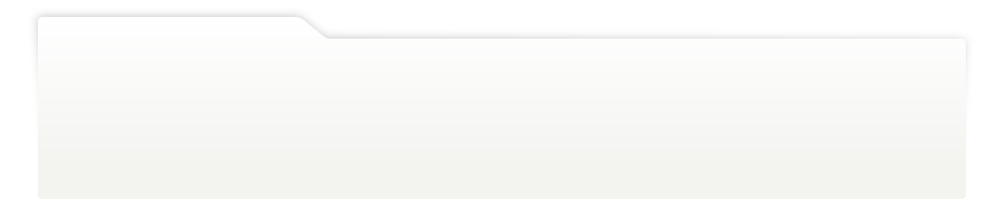
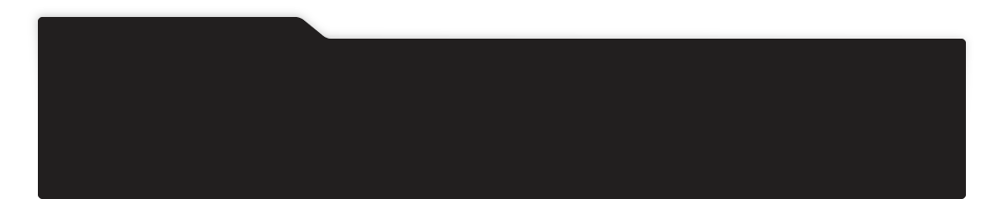
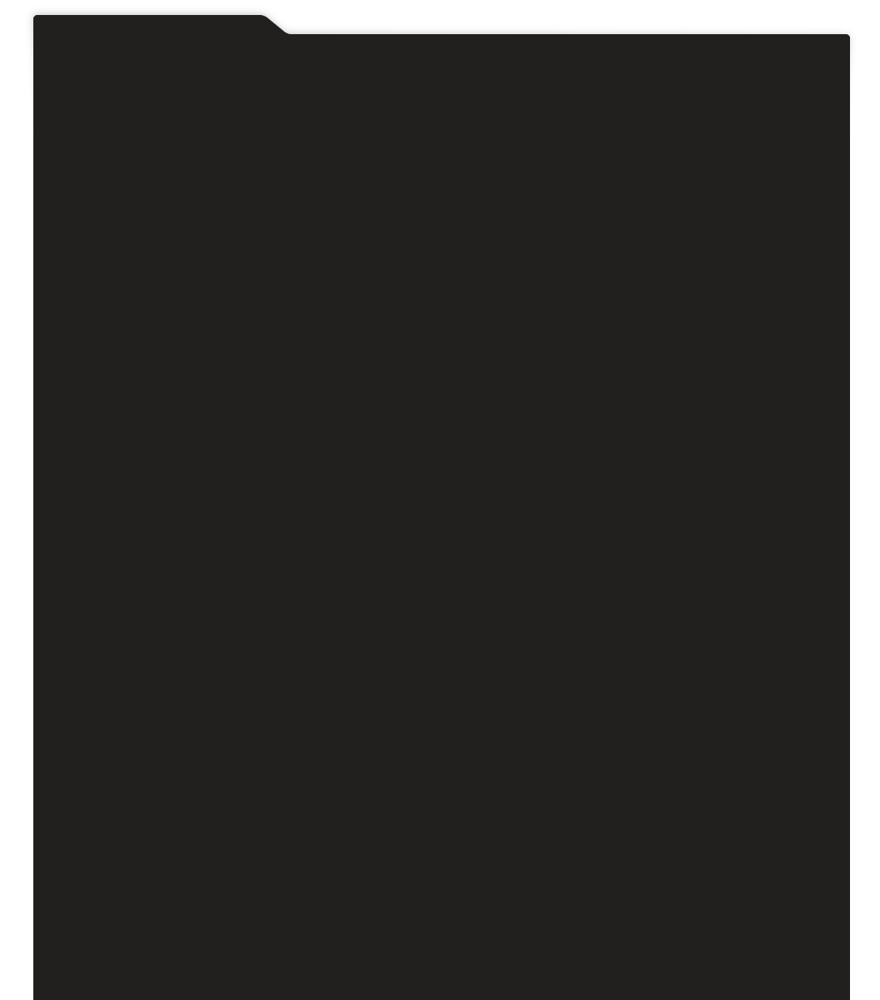
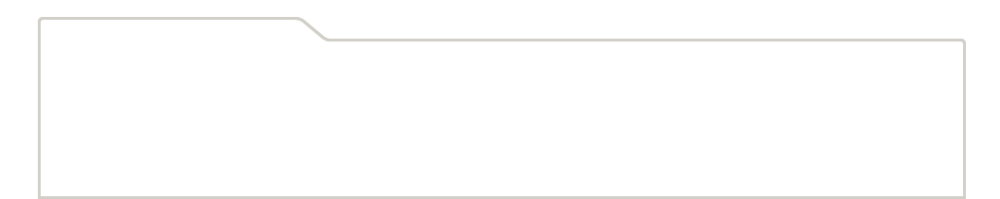
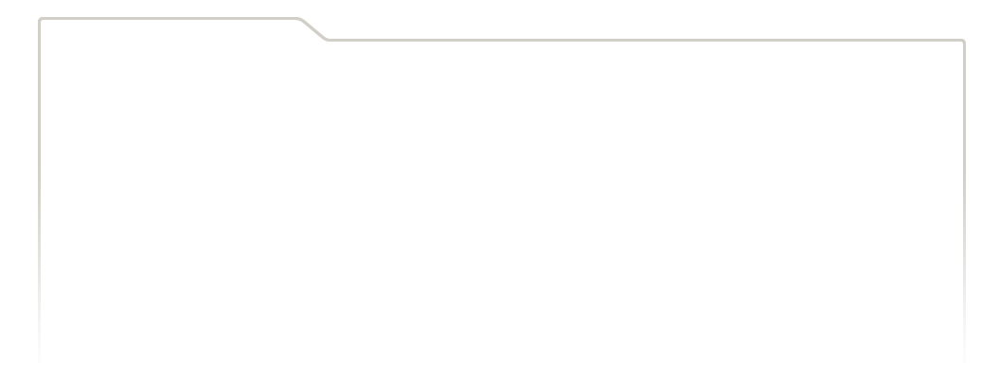
...
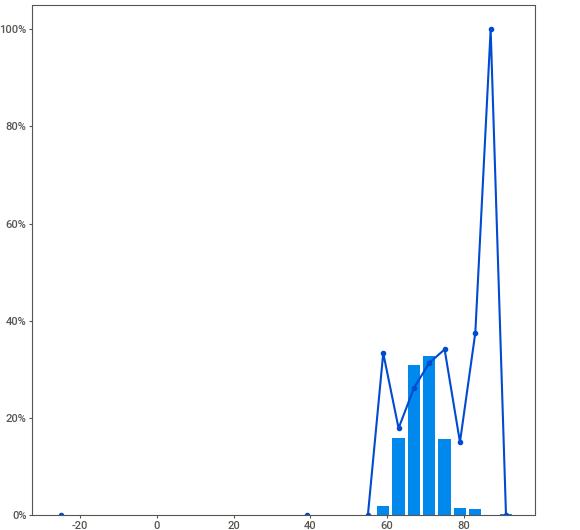
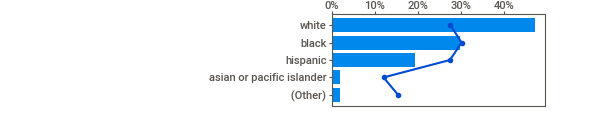
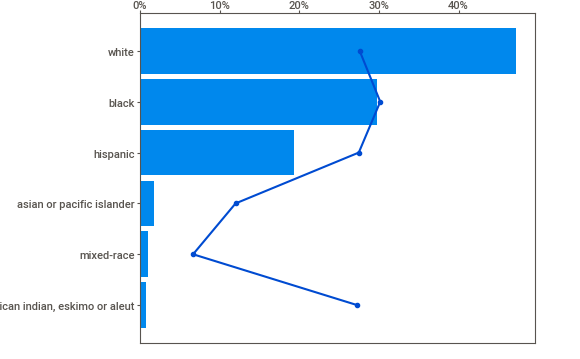
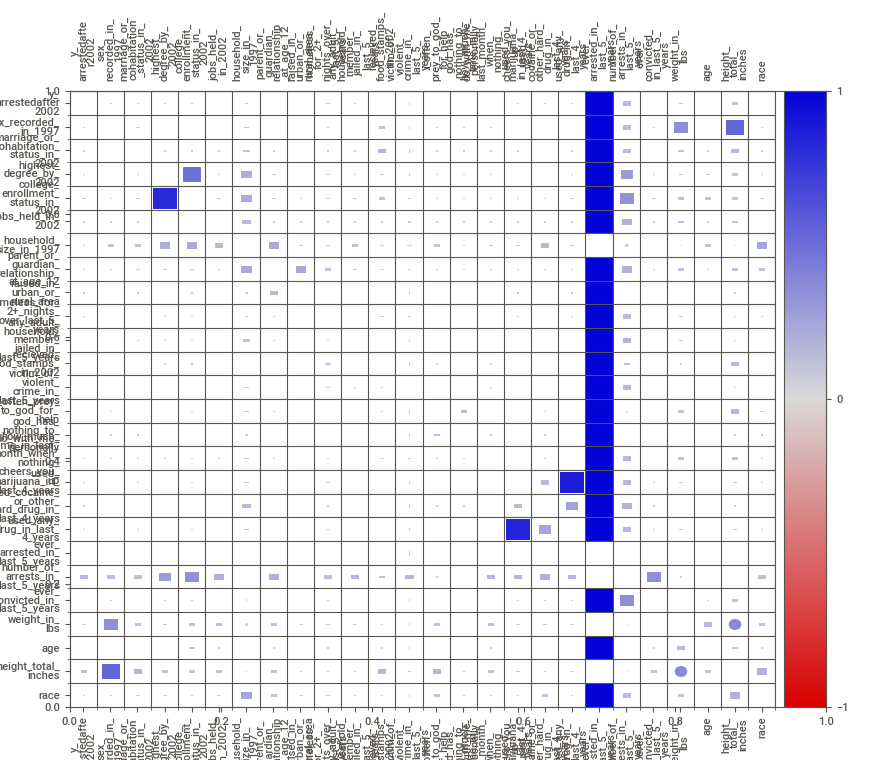
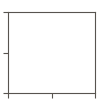

In [ ]:
loan_report = sv.analyze(df, target_feat='y_arrestedafter2002')
loan_report.show_notebook()

In [ ]:
loan_report.show_html()

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Download

In [ ]:
# Download

report_sweetviz_filename = "SWEETVIZ_REPORT.html"
# loan_report.show_html(report_sweetviz_filename)
files.download(report_sweetviz_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## AutoViz

In [ ]:
import nltk

In [ ]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
loan_av = AutoViz_Class()

In [ ]:
dft = loan_av.AutoViz(filename='', dfte=df, verbose=1, depVar='y_arrestedafter2002',
                 lowess=False,chart_format='svg')

Shape of your Data Set loaded: (1412, 28)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  6
    Number of String-Categorical Columns =  7
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  11
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  1
    27 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['ever_arrested_in_last_5_years']

################ Binary_Classifi

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
sex_recorded_in_1997,object,0.000000,0,,,No issue
marriage_or_cohabitation_status_in_2002,object,0.000000,0,,,"5 rare categories: ['married, spouse absent', 'separated, not cohabiting', 'divorced, not cohabiting', 'separated, cohabiting', 'divorced, cohabiting']. Group them into a single category or drop the categories."
highest_degree_by_2002,object,0.000000,0,,,"2 rare categories: ['associate/junior college (AA)', ""bachelor's degree (BA, BS)""]. Group them into a single category or drop the categories."
college_enrollment_status_in_2002,object,0.000000,0,,,"3 rare categories: ['not enrolled, 4-year college graduate', 'not enrolled, 2-year college graduate', 'enrolled in a graduate program']. Group them into a single category or drop the categories."
jobs_held_in_2002,int64,0.000000,0,0.000000,9.000000,Column has 125 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
household_size_in_1997,int64,0.000000,0,2.000000,14.000000,Column has 217 outliers greater than upper bound (6.50) or lower than lower bound(2.50). Cap them or remove them.
parent_or_guardian_relationship_at_age_12,object,0.000000,0,,,"4 rare categories: ['biological father, other parent present', 'anything else', 'foster parent(s)', 'group quarters']. Group them into a single category or drop the categories."
raised_in_urban_or_rural_area,object,0.000000,0,,,No issue
homeless_for_2+_nights_over_last_5_years,bool,0.000000,0,0.000000,1.000000,No issue
any_adult_household_member_jailed_in_last_5_years,bool,0.000000,0,0.000000,1.000000,No issue


Total Number of Scatter Plots = 21
Could not draw some Distribution Plots 'numpy.int64' object has no attribute 'startswith'


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

All Plots done
Time to run AutoViz = 44 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
profile = ProfileReport(df, title='Loan Default Report', explorative=True)

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("loan_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Download

In [ ]:
!cp loan_report.html AUTOVIZ_REPORT.html

In [ ]:
# Download

report_autoviz_filename = "AUTOVIZ_REPORT.html"
files.download(report_autoviz_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Download EDA Reports

In [ ]:
# prompt: create a file_ls with filenames ending in *.csv and *.html
'''
import glob

def create_file_ls(pattern_ls):
  """
  Creates a list of files matching specified patterns.

  Args:
    pattern_ls: A list of file patterns (e.g., "*.csv", "*.html").

  Returns:
    A list of file names that match the provided patterns.
  """
  file_ls = []
  for pattern in pattern_ls:
    file_ls.extend(glob.glob(pattern))
  return file_ls

# Example usage
file_patterns = ["*.csv", "*.html"]
file_list = create_file_ls(file_patterns)

# Print the generated list
file_list
''';

['model_performance_results.csv',
 'ibm_vignettes.csv',
 'ibm_vignettes (1).csv',
 'ibm_vignettes_clean.csv',
 'SWEETVIZ_REPORT.html',
 'loan_report.html']

In [ ]:
# prompt: individually download all the files in the list file_list
'''
from google.colab import files
import glob

def create_file_ls(pattern_ls):
  """
  Creates a list of files matching specified patterns.

  Args:
    pattern_ls: A list of file patterns (e.g., "*.csv", "*.html").

  Returns:
    A list of file names that match the provided patterns.
  """
  file_ls = []
  for pattern in pattern_ls:
    file_ls.extend(glob.glob(pattern))
  return file_ls

# Example usage
file_patterns = ["*.csv", "*.html"]
file_list = create_file_ls(file_patterns)

# Print the generated list
print(file_list)

for file in file_list:
  files.download(file)
''';

['model_performance_results.csv', 'ibm_vignettes.csv', 'ibm_vignettes (1).csv', 'ibm_vignettes_clean.csv', 'SWEETVIZ_REPORT.html', 'loan_report.html']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

(_ray_fit pid=20095) /usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
(_ray_fit pid=20095) Dask dataframe query planning is disabled because dask-expr is not installed.
(_ray_fit pid=20095) 
(_ray_fit pid=20095) You can install it with `pip install dask[dataframe]` or `conda install dask`.
(_ray_fit pid=20095) This will raise in a future version.
(_ray_fit pid=20095) 
(_ray_fit pid=20095)   warnings.warn(msg, FutureWarning)
(_ray_fit pid=20097) /usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
(_ray_fit pid=20097) Dask dataframe query planning is disabled because dask-expr is not installed.
(_ray_fit pid=20097) 
(_ray_fit pid=20097) You can install it with `pip install dask[dataframe]` or `conda install dask`.
(_ray_fit pid=20097) This will raise in a future version.
(_ray_fit pid=20097) 
(_ray_fit pid=20097)   warnings.warn(msg, FutureWarning)


# CUSTOMIZED: Data Alerts

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype 
---  ------                                                  --------------  ----- 
 0   sex_recorded_in_1997                                    1412 non-null   object
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object
 2   highest_degree_by_2002                                  1412 non-null   object
 3   college_enrollment_status_in_2002                       1412 non-null   object
 4   jobs_held_in_2002                                       1412 non-null   int64 
 5   household_size_in_1997                                  1412 non-null   int64 
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object
 7   raised_in_urban_or_rural_area                           1412 non-null   object
 8   homeless_for_2+_nights_over_last_5_years        

In [ ]:
def plot_histogram(series, figsize=(12, 6), bins=20, color='#4f46e5'):
    """
    Creates a histogram with statistical annotations for a pandas Series.

    Parameters:
        series (pandas.Series): The input data series to plot
        figsize (tuple): Figure dimensions (width, height) in inches
        bins (int): Number of histogram bins
        color (str): Hex color code or name for histogram bars

    Returns:
        matplotlib.figure.Figure: The generated histogram plot
    """
    # Create figure and axis
    plt.figure(figsize=figsize)

    # Create histogram
    plt.hist(series, bins=bins, color=color, alpha=0.7, edgecolor='black')

    # Add title and labels
    plt.title(f'Distribution of {series.name}', fontsize=14, pad=15)
    plt.xlabel(series.name, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)

    # Add grid
    plt.grid(True, alpha=0.3)

    # Add statistical reference lines
    plt.axvline(series.mean(), color='red', linestyle='--', alpha=0.8,
                label=f'Mean: {series.mean():.1f}')
    plt.axvline(series.median(), color='green', linestyle='--', alpha=0.8,
                label=f'Median: {series.median():.1f}')

    # Add legend
    plt.legend()

    # Adjust layout
    plt.tight_layout()

    # Print summary statistics
    print(f"\nSummary Statistics for {series.name}:")
    print(series.describe().round(2))

    return plt.gcf()

## Imbalanced Features

### marriage_or_cohabitation_status_in_2002 (61.0%)

In [ ]:
df['marriage_or_cohabitation_status_in_2002'].value_counts()

,count
marriage_or_cohabitation_status_in_2002,
"never married, not cohabiting",1062
"never married, cohabiting",228
"married, spouse present",85
"married, spouse absent",14
"separated, not cohabiting",10
"divorced, not cohabiting",8
"separated, cohabiting",3
"divorced, cohabiting",2


### homeless_for_2+_nights_over_last_5_years (73.4%)

In [ ]:
df['homeless_for_2+_nights_over_last_5_years'].value_counts()

,count
homeless_for_2+_nights_over_last_5_years,
False,1348
True,64


### recieved_food_stamps_in_2002 (54.5%)

In [ ]:
df['recieved_food_stamps_in_2002'].value_counts()

,count
recieved_food_stamps_in_2002,
False,1277
True,135


## Rare Categories

### marriage_or_cohabitation_status_in_2002

5 rare categories: ['married, spouse absent', 'separated, not cohabiting', 'divorced, not cohabiting', 'separated, cohabiting', 'divorced, cohabiting']. Group them into a single category or drop the categories.

In [ ]:
df['marriage_or_cohabitation_status_in_2002'].value_counts()

,count
marriage_or_cohabitation_status_in_2002,
"never married, not cohabiting",1062
"never married, cohabiting",228
"married, spouse present",85
"married, spouse absent",14
"separated, not cohabiting",10
"divorced, not cohabiting",8
"separated, cohabiting",3
"divorced, cohabiting",2


### highest_degree_by_2002

2 rare categories: ['associate/junior college (AA)', "bachelor's degree (BA, BS)"]. Group them into a single category or drop the categories.

In [ ]:
df['highest_degree_by_2002'].value_counts()

,count
highest_degree_by_2002,
high school diploma (HS),611
Unknown,610
GED,179
associate/junior college (AA),6
"bachelor's degree (BA, BS)",6


### college_enrollment_status_in_2002

3 rare categories: ['not enrolled, 4-year college graduate', 'not enrolled, 2-year college graduate', 'enrolled in a graduate program']. Group them into a single category or drop the categories.

In [ ]:
df['college_enrollment_status_in_2002'].value_counts()

,count
college_enrollment_status_in_2002,
"not enrolled, no high school degree, no GED",444
"not enrolled, high school degree",318
"not enrolled, GED",185
"not enrolled, some college",130
enrolled in a 4-year college,121
"enrolled in grades 1-12, not a high school graduate",117
enrolled in a 2-year college,83
"not enrolled, 4-year college graduate",7
"not enrolled, 2-year college graduate",4


### parent_or_guardian_relationship_at_age_12

4 rare categories: ['biological father, other parent present', 'anything else', 'foster parent(s)', 'group quarters']. Group them into a single category or drop the categories.

In [ ]:
df['parent_or_guardian_relationship_at_age_12'].value_counts()

,count
parent_or_guardian_relationship_at_age_12,
"biological mother, marital status unknown",610
both biological parents,392
Unknown,181
"other adults, biological parent status unknown, not group quarters",69
"biological dad, marital status unknown",66
"biological mother, other parent present",54
adoptive parent(s),19
"biological father, other parent present",10
anything else,7


### race

1 rare categories: ['american indian, eskimo or aleut']. Group them into a single category or drop the categories

In [ ]:
df['race'].value_counts()

,count
race,
white,667
black,421
hispanic,273
asian or pacific islander,25
mixed-race,15
"american indian, eskimo or aleut",11


## Feature Outliers: [NOP] or [CLIP]

* [NOP] : No Operation (do nothing)
* [CLIP] : Clip Outliers (beyond 1.5 IQR)

In [ ]:
def clip_outliers(series, iqr_cutoff=1.5):
    """
    Clips outliers in a pandas Series using the Interquartile Range (IQR) method.

    Parameters:
        series (pandas.Series): The input series containing numeric data
        iqr_cutoff (float): The IQR multiplier to determine outlier bounds (default: 1.5)

    Returns:
        pandas.Series: A new series with outliers clipped to the IQR bounds
    """
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - iqr_cutoff * IQR
    upper_bound = Q3 + iqr_cutoff * IQR

    return series.clip(lower=lower_bound, upper=upper_bound)

### [NOP] jobs_held_in_2002

Column has 125 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them

In [ ]:
df['jobs_held_in_2002'].value_counts()

,count
jobs_held_in_2002,
1,449
2,340
0,290
3,208
4,86
5,27
6,9
7,2
9,1


### [NOP] household_size_in_1997

Column has 217 outliers greater than upper bound (6.50) or lower than lower bound(2.50). Cap them or remove them

In [ ]:
df['household_size_in_1997'].value_counts()

,count
household_size_in_1997,
4,440
5,336
3,252
6,167
2,85
7,69
8,27
9,17
10,14


### [NOP] number_of_arrests_in_last_5_years

Column has 93 outliers greater than upper bound (6.00) or lower than lower bound(-2.00). Cap them or remove them

In [ ]:
df['number_of_arrests_in_last_5_years'].value_counts()

,count
number_of_arrests_in_last_5_years,
1,767
2,276
3,118
4,85
5,42
6,31
7,21
10,18
9,18


### [CLIP] weight_in_lbs

Column has 48 outliers greater than upper bound (257.50) or lower than lower bound(69.50). Cap them or remove them.

In [ ]:
df['weight_in_lbs'].describe()

,weight_in_lbs
count,1412.000000
mean,168.761331
std,39.939382
min,3.000000
25%,140.000000
50%,162.000000
75%,187.000000
max,410.000000



Summary Statistics for weight_in_lbs:
count    1412.00
mean      168.76
std        39.94
min         3.00
25%       140.00
50%       162.00
75%       187.00
max       410.00
Name: weight_in_lbs, dtype: float64


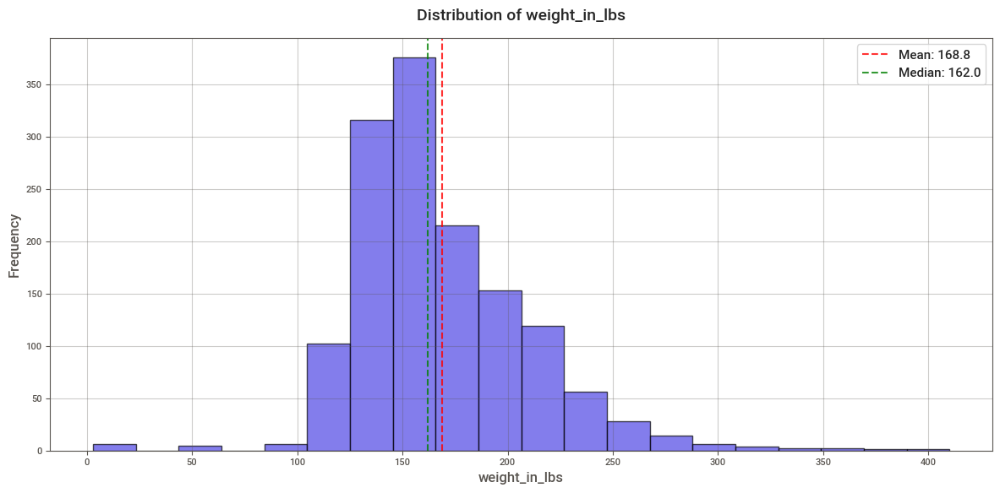

In [ ]:
plot_histogram(df['weight_in_lbs'])

In [ ]:
# Clip outliers to IQR = 1.5
df['weight_in_lbs'] = clip_outliers(df['weight_in_lbs'], iqr_cutoff=1.5)

In [ ]:
df['weight_in_lbs'].describe()

,weight_in_lbs
count,1412.000000
mean,168.097025
std,35.788077
min,69.500000
25%,140.000000
50%,162.000000
75%,187.000000
max,257.500000


### [CLIP] height_total_inches

Column has 20 outliers greater than upper bound (81.00) or lower than lower bound(57.00). Cap them or remove them

In [ ]:
df['height_total_inches'].describe()

,height_total_inches
count,1412.000000
mean,68.574363
std,5.130141
min,-27.000000
25%,66.000000
50%,69.000000
75%,72.000000
max,93.000000



Summary Statistics for height_total_inches:
count    1412.00
mean       68.57
std         5.13
min       -27.00
25%        66.00
50%        69.00
75%        72.00
max        93.00
Name: height_total_inches, dtype: float64


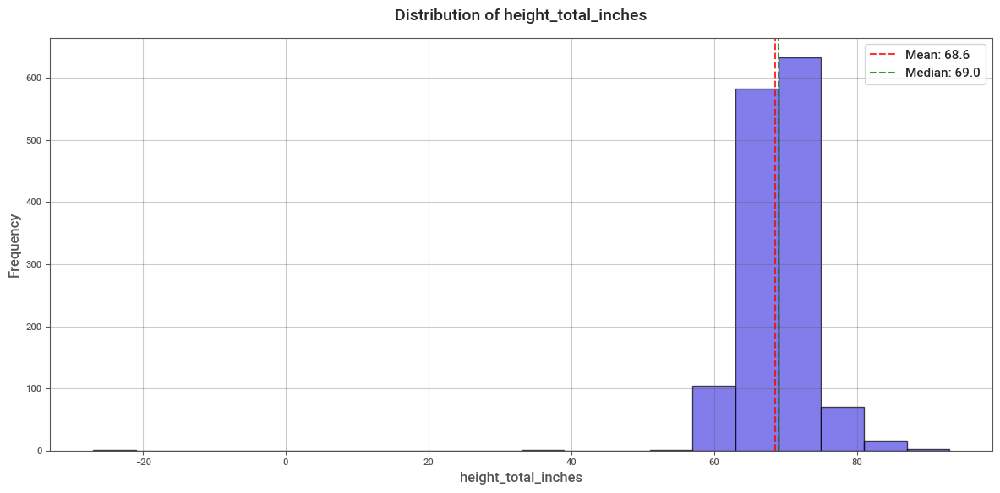

In [ ]:
plot_histogram(df['height_total_inches'])

In [ ]:
# Clip outliers to IQR = 1.5
df['height_total_inches'] = clip_outliers(df['height_total_inches'], iqr_cutoff=1.5)

In [ ]:
df['height_total_inches'].describe()

,height_total_inches
count,1412.000000
mean,68.609773
std,4.260975
min,57.000000
25%,66.000000
50%,69.000000
75%,72.000000
max,81.000000


## Correlated Features: [KEEP] or [DROP]

In [ ]:
def two_column_corr(df_subset, feature_type='categorical', figsize=(10, 6)):
    """
    Analyzes and visualizes correlation between two columns based on specified feature type.

    Parameters:
        df_subset (pd.DataFrame): DataFrame containing exactly two columns
        feature_type (str): Type of features to analyze ('categorical' or 'numerical')
        figsize (tuple): Figure dimensions (width, height) in inches

    Returns:
        dict: Dictionary containing correlation metrics where one is the computed value
              based on feature_type and the other is np.nan
    """
    if len(df_subset.columns) != 2:
        raise ValueError("Input DataFrame must contain exactly two columns")

    if feature_type not in ['categorical', 'numerical']:
        raise ValueError("feature_type must be either 'categorical' or 'numerical'")

    col1, col2 = df_subset.columns
    results = {'spearman': np.nan, 'cramers_v': np.nan}

    try:
        plt.figure(figsize=figsize)

        if feature_type == 'numerical':
            if not all(df_subset[col].dtype.kind in 'biufc' for col in [col1, col2]):
                raise ValueError("Both columns must be numeric for numerical correlation")

            correlation = df_subset[col1].corr(df_subset[col2], method='spearman')
            results['spearman'] = correlation

            plt.scatter(df_subset[col1], df_subset[col2], alpha=0.5)
            z = np.polyfit(df_subset[col1], df_subset[col2], 1)
            p = np.poly1d(z)
            plt.plot(df_subset[col1], p(df_subset[col1]), "r--", alpha=0.8)

            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.title(f'Spearman Correlation: {correlation:.3f}\n{col1} vs {col2}')

        else:  # categorical
            contingency = pd.crosstab(df_subset[col1], df_subset[col2])
            chi2, _, _, _ = chi2_contingency(contingency)
            n = contingency.sum().sum()
            min_dim = min(contingency.shape) - 1
            cramers_v = np.sqrt(chi2 / (n * min_dim)) if min_dim > 0 else 0
            results['cramers_v'] = cramers_v

            normalized_contingency = contingency.div(contingency.sum(axis=1), axis=0)
            sns.heatmap(normalized_contingency, annot=True, cmap='YlGnBu', fmt='.2f')
            plt.title(f"Cramer's V: {cramers_v:.3f}\n{col1} vs {col2}")

        plt.tight_layout()

    except Exception as e:
        plt.close()  # Clean up the figure if an error occurs
        raise e

    return results

### [KEEP] college_enrollment_status_in_2002 [AND] highest_degree_by_2002

In [ ]:
# For categorical features
cat_corr = two_column_corr(df[['college_enrollment_status_in_2002', 'highest_degree_by_2002']],
                          feature_type='categorical')
print("Categorical correlation results:", cat_corr)

# For numerical features (example with numeric columns)
# num_corr = two_column_corr(df[['age', 'income']], feature_type='numerical')

Categorical correlation results: {'spearman': nan, 'cramers_v': 0.7328392285457738}


### [DROP] used_any_drug_in_last_4_years [AND] used_marijuana_in_last_4_years

* Drop used_any_drug_in_last_4_years

In [ ]:
# For categorical features
cat_corr = two_column_corr(df[['used_any_drug_in_last_4_years','used_marijuana_in_last_4_years']],
                          feature_type='categorical')
print("Categorical correlation results:", cat_corr)

# For numerical features (example with numeric columns)
# num_corr = two_column_corr(df[['age', 'income']], feature_type='numerical')

Categorical correlation results: {'spearman': nan, 'cramers_v': 0.9458819972166352}


#### Cross Correlations

In [ ]:
# For categorical features
cat_corr = two_column_corr(df[['used_any_drug_in_last_4_years','used_cocaine_or_other_hard_drug_in_last_4_years']],
                          feature_type='categorical')
print("Categorical correlation results:", cat_corr)

# For numerical features (example with numeric columns)
# num_corr = two_column_corr(df[['age', 'income']], feature_type='numerical')

Categorical correlation results: {'spearman': nan, 'cramers_v': 0.41517980552484135}


In [ ]:
# For categorical features
cat_corr = two_column_corr(df[['used_marijuana_in_last_4_years','used_cocaine_or_other_hard_drug_in_last_4_years']],
                          feature_type='categorical')
print("Categorical correlation results:", cat_corr)

# For numerical features (example with numeric columns)
# num_corr = two_column_corr(df[['age', 'income']], feature_type='numerical')

Categorical correlation results: {'spearman': nan, 'cramers_v': 0.3347523377841863}


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   sex_recorded_in_1997                                    1412 non-null   object 
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object 
 2   highest_degree_by_2002                                  1412 non-null   object 
 3   college_enrollment_status_in_2002                       1412 non-null   object 
 4   jobs_held_in_2002                                       1412 non-null   int64  
 5   household_size_in_1997                                  1412 non-null   int64  
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object 
 7   raised_in_urban_or_rural_area                           1412 non-null   object 
 8   homeless_for_2+_nights_over_last_5_yea

## Save and Download

In [ ]:
# prompt: download normalized_df as ibm_vignettes_normalized.csv

df.to_csv('ibm_vignettes_renamed_clean.csv', encoding = 'utf-8')
files.download('ibm_vignettes_renamed_clean.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# [OPTIONAL START] Upload Clean Datafile

In [ ]:
# prompt: upload *.csv file into Pandas DataFrame df

uploaded = files.upload()

for fn in uploaded.keys():
  if fn.endswith('.csv'):
    df = pd.read_csv(io.BytesIO(uploaded[fn]), index_col=0)
    print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
    break # Assumes only one .csv file is uploaded

Saving ibm_vignettes_clean (11).csv to ibm_vignettes_clean (11) (5).csv
User uploaded file "ibm_vignettes_clean (11) (5).csv" with length 1414240 bytes


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1412 entries, 0 to 1411
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   pubid                  1412 non-null   object 
 1   sex                    1412 non-null   object 
 2   married02              1412 non-null   object 
 3   educ02                 1412 non-null   object 
 4   college02              1412 non-null   object 
 5   experience02           1412 non-null   int64  
 6   hhsize97               1412 non-null   int64  
 7   parentrelations        1412 non-null   object 
 8   urbanrural             1412 non-null   object 
 9   homelessness           1412 non-null   bool   
 10  faminjail              1412 non-null   bool   
 11  foodstamp              1412 non-null   bool   
 12  victim                 1412 non-null   bool   
 13  askgod                 1412 non-null   bool   
 14  godhasnothingtodo      1412 non-null   bool   
 15  expectdea

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# prompt: from df, drop columns=['long','short','expectdeath']

df.drop(columns=['pubid','long', 'short', 'expectdeath','anydrug','convictedafter2002'], inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1412 entries, 0 to 1411
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   sex                    1412 non-null   object
 1   married02              1412 non-null   object
 2   educ02                 1412 non-null   object
 3   college02              1412 non-null   object
 4   experience02           1412 non-null   int64 
 5   hhsize97               1412 non-null   int64 
 6   parentrelations        1412 non-null   object
 7   urbanrural             1412 non-null   object
 8   homelessness           1412 non-null   bool  
 9   faminjail              1412 non-null   bool  
 10  foodstamp              1412 non-null   bool  
 11  victim                 1412 non-null   bool  
 12  askgod                 1412 non-null   bool  
 13  godhasnothingtodo      1412 non-null   bool  
 14  depression             1412 non-null   object
 15  marijuana              141

# Model Dependencies and Assumptions

## Overview

| Model/Requirement | Missing Values | Distribution Requirements | Class Balance | Outlier Sensitivity | Feature Correlations | Ordinal Encoding | Nominal Encoding | Feature Scaling | Sample Size |
|------------------|----------------|-------------------------|---------------|-------------------|---------------------|-----------------|-----------------|----------------|--------------|
| Logistic Regression | No NaN allowed | No distribution assumption, but performs better with normal | Sensitive to imbalance | Sensitive | Sensitive to multicollinearity | Ordinal or Label | One-hot | Required | Moderate |
| SVM | No NaN allowed | No specific requirement | Moderately sensitive | Moderately sensitive | Robust | Ordinal or Label | One-hot | Required | Small to moderate |
| Naive Bayes | No NaN allowed | Assumes feature independence | Relatively robust | Relatively robust | Assumes independence | Label | One-hot | Not required | Small |
| XGBoost | Handles NaN | No distribution assumption | Robust | Robust | Robust | Label or Ordinal | Label or One-hot | Not required | Moderate to large |
| MLP | No NaN allowed | No distribution assumption | Sensitive to imbalance | Sensitive | Robust | Normalized ordinal | One-hot | Required | Large |
| TabNet | Handles NaN | No distribution assumption | Relatively robust | Relatively robust | Robust | Learned embeddings | Learned embeddings | Not required | Large |
| TabPFN | No NaN allowed | No distribution assumption | Relatively robust | Moderately sensitive | Robust | Label | One-hot | Required | Small to moderate |
| TabLLM | Handles NaN | No distribution assumption | Relatively robust | Robust | Robust | Learned embeddings | Learned embeddings | Not required | Large |

```
###MODELS_BINARY_CLASSIFIERS:
SML
- logistical regression
- SVM
- NB
- XGBoost
DL
- MPL
LLM
- TabNet
- TabPFN
- TabLLM
###INSTRUCTIONS:
Create a table with a row for each model and columns for each model requirement or assumption like:
- no NaN
- normal distribution
- balanced categories
- no outliers (within 1.5 IQR)
- sensitivity to feature/column correlations
- best encoding for ordinal categorical features/columns
- best encoding for nominal categorical features/columns
- etc (any other requirements/assumptions)
```

I'll create a comprehensive table comparing the requirements and assumptions for these machine learning models used in binary classification. For clarity and completeness, I'll first create a thorough list of important model assumptions and requirements, then organize them in a detailed table.

Here's a detailed comparison table of model requirements and assumptions:

| Model/Requirement | Missing Values | Distribution Requirements | Class Balance | Outlier Sensitivity | Feature Correlations | Ordinal Encoding | Nominal Encoding | Feature Scaling | Sample Size |
|------------------|----------------|-------------------------|---------------|-------------------|---------------------|-----------------|-----------------|----------------|--------------|
| Logistic Regression | No NaN allowed | No distribution assumption, but performs better with normal | Sensitive to imbalance | Sensitive | Sensitive to multicollinearity | Ordinal or Label | One-hot | Required | Moderate |
| SVM | No NaN allowed | No specific requirement | Moderately sensitive | Moderately sensitive | Robust | Ordinal or Label | One-hot | Required | Small to moderate |
| Naive Bayes | No NaN allowed | Assumes feature independence | Relatively robust | Relatively robust | Assumes independence | Label | One-hot | Not required | Small |
| XGBoost | Handles NaN | No distribution assumption | Robust | Robust | Robust | Label or Ordinal | Label or One-hot | Not required | Moderate to large |
| MLP | No NaN allowed | No distribution assumption | Sensitive to imbalance | Sensitive | Robust | Normalized ordinal | One-hot | Required | Large |
| TabNet | Handles NaN | No distribution assumption | Relatively robust | Relatively robust | Robust | Learned embeddings | Learned embeddings | Not required | Large |
| TabPFN | No NaN allowed | No distribution assumption | Relatively robust | Moderately sensitive | Robust | Label | One-hot | Required | Small to moderate |
| TabLLM | Handles NaN | No distribution assumption | Relatively robust | Robust | Robust | Learned embeddings | Learned embeddings | Not required | Large |

Additional important considerations for each model:

Logistic Regression:
- Assumes linearity between features and log-odds of the outcome
- Requires independent observations
- Benefits from feature selection to reduce multicollinearity

SVM:
- Kernel choice significantly impacts performance
- Memory intensive for large datasets
- Works well in high-dimensional spaces

Naive Bayes:
- Assumes strong feature independence
- Performs well with high-dimensional data
- Particularly effective for text classification

XGBoost:
- Handles interactions automatically
- Can capture non-linear relationships
- Requires tuning of multiple hyperparameters

MLP (Multi-Layer Perceptron):
- Requires significant hyperparameter tuning
- Computationally intensive
- Prone to overfitting without proper regularization

TabNet:
- Self-attention mechanism for feature selection
- Interpretable feature importance
- Requires GPU for efficient training

TabPFN:
- Limited to smaller datasets (typically <1000 samples)
- No hyperparameter tuning required
- Fixed architecture

TabLLM:
- Requires significant computational resources
- Can handle mixed data types effectively
- Benefits from transfer learning

This comparison shows that modern approaches like TabNet and TabLLM tend to be more flexible and robust to various data characteristics, while traditional methods like logistic regression and SVM have more stringent requirements but may be more interpretable and computationally efficient for smaller datasets.

## Column Summary by Type

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   sex_recorded_in_1997                                    1412 non-null   object 
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object 
 2   highest_degree_by_2002                                  1412 non-null   object 
 3   college_enrollment_status_in_2002                       1412 non-null   object 
 4   jobs_held_in_2002                                       1412 non-null   int64  
 5   household_size_in_1997                                  1412 non-null   int64  
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object 
 7   raised_in_urban_or_rural_area                           1412 non-null   object 
 8   homeless_for_2+_nights_over_last_5_yea

### Numeric Columns

In [ ]:
# For Numeric Columns
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
jobs_held_in_2002,1412.0,1.635269,1.320171,0.0,1.0,1.0,2.0,9.0
household_size_in_1997,1412.0,4.545326,1.564602,2.0,4.0,4.0,5.0,14.0
number_of_arrests_in_last_5_years,1412.0,2.333569,2.378424,1.0,1.0,1.0,3.0,22.0
y_arrestedafter2002,1412.0,0.278329,0.448335,0.0,0.0,0.0,1.0,1.0
weight_in_lbs,1412.0,168.097025,35.788077,69.5,140.0,162.0,187.0,257.5
age,1412.0,39.986544,1.385545,38.0,39.0,40.0,41.0,42.0
height_total_inches,1412.0,68.609773,4.260975,57.0,66.0,69.0,72.0,81.0


### Categorical Columns

In [ ]:
# For Categorical Columns
df.describe(include=['object', 'category']).transpose()

,count,unique,top,freq
sex_recorded_in_1997,1412,2,male,1014
marriage_or_cohabitation_status_in_2002,1412,8,"never married, not cohabiting",1062
highest_degree_by_2002,1412,5,high school diploma (HS),611
college_enrollment_status_in_2002,1412,10,"not enrolled, no high school degree, no GED",444
parent_or_guardian_relationship_at_age_12,1412,11,"biological mother, marital status unknown",610
raised_in_urban_or_rural_area,1412,3,urban,847
how_much_time_in_last_month_when_nothing_cheers_you_up,1412,4,none of the time,791
short_text_summary,1412,342,The person is an 18-year-old male who identifies himself as White. He has been arrested 1 time but has not been convicted.,36
long_text_summary,1412,1412,"The person is an 18-year-old male who identifies himself as Hispanic. He has been arrested 6 times and has been convicted. He is 5 feet 0 inches and weighs between 150 and 174 lbs. He has never been married and is currently not living alone. He does not have a high school diploma or GED certificate and is not enrolled in college. He has held no jobs during the year. He has used drugs in the past four years (marijuana) and has not felt depressed over the past month. At a young age, he lived with his biological mother in a household of size 6, in an urban area. He considers that God has something to do with what happens to him personally.",1
race,1412,6,white,667


### Binary Columns

In [ ]:
# For Binary Columns
df.describe(include=['boolean']).transpose()


,count,unique,top,freq
homeless_for_2+_nights_over_last_5_years,1412,2,False,1348
any_adult_household_member_jailed_in_last_5_years,1412,2,False,1230
recieved_food_stamps_in_2002,1412,2,False,1277
victim_of_violent_crime_in_last_5_years,1412,2,False,1235
i_often_prey_to_god_for_help,1412,2,True,975
god_has_nothing_to_do_with_me_personally,1412,2,False,1014
used_marijuana_in_last_4_years,1412,2,True,993
used_cocaine_or_other_hard_drug_in_last_4_years,1412,2,False,968
used_any_drug_in_last_4_years,1412,2,True,1024
ever_arrested_in_last_5_years,1412,1,True,1412


# Statistical ML Models

In [ ]:
'''
# scikit-learn imports
from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, FunctionTransformer,
    OneHotEncoder
)
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score,
    precision_score, recall_score, confusion_matrix
)

# Model imports
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import RobustScaler

from sklearn.preprocessing import QuantileTransformer
''';

In [ ]:
# scikit-learn imports
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score,
    precision_score, recall_score, confusion_matrix
)

# Model imports
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE

class ModelEvaluator:
    def __init__(self, df: pd.DataFrame, target_col: str = 'y_arrestedafter2002'):
        self.df = df
        self.target_col = target_col
        self.setup_logging()

        self.numeric_features = df.select_dtypes(include=['int64', 'float64']).columns
        self.numeric_features = [col for col in self.numeric_features if col != target_col]
        self.categorical_features = df.select_dtypes(include=['object', 'bool']).columns
        self.text_features = ['short_text_summary', 'long_text_summary']
        self.categorical_features = [col for col in self.categorical_features
                                   if col not in self.text_features]

    def setup_logging(self):
        log_dir = Path("model_evaluation_logs")
        log_dir.mkdir(exist_ok=True)
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        logging.basicConfig(
            level=logging.INFO,
            format='%(asctime)s - %(levelname)s - %(message)s',
            handlers=[
                logging.FileHandler(f"model_evaluation_logs/evaluation_{timestamp}.log"),
                logging.StreamHandler()
            ]
        )

    def get_preprocessing_pipeline(self, model_type: str) -> Pipeline:
        """
        Creates preprocessing pipeline with enhanced numerical stability for Naive Bayes.
        """
        if model_type == 'naive_bayes':
            numeric_transformer = Pipeline(steps=[
                ('scaler', StandardScaler()),
                ('quantile', QuantileTransformer(
                    n_quantiles=1000,
                    output_distribution='normal'
                ))
            ])
        else:
            numeric_transformer = Pipeline(steps=[
                ('scaler', StandardScaler())
            ])

        categorical_transformer = OneHotEncoder(
            drop=None,
            handle_unknown='ignore',
            sparse_output=False
        )

        return ColumnTransformer(
            transformers=[
                ('num', numeric_transformer, self.numeric_features),
                ('cat', categorical_transformer, self.categorical_features)
            ],
            remainder='drop'
        )

    def get_model(self, model_type: str) -> object:
        """
        Initializes models with optimized parameters.
        """
        models = {
            'logistic_regression': LogisticRegression(
                max_iter=1000, random_state=42
            ),
            'svm': SVC(
                probability=True, random_state=42
            ),
            'naive_bayes': GaussianNB(
                var_smoothing=1e-3,
                priors=None
            ),
            'xgboost': XGBClassifier(
                random_state=42
            ),
            'mlp': MLPClassifier(
                max_iter=1000, random_state=42
            )
        }
        return models[model_type]

    def evaluate_model(self, model_type: str, n_splits: int = 5) -> Optional[Dict]:
        print(f"\nEvaluating {model_type.upper()}...")
        start_time = time.time()

        X = self.df.drop(columns=[self.target_col] + self.text_features)
        y = self.df[self.target_col]

        metrics = {
            'model_name': model_type,
            'accuracy': [], 'f1': [], 'roc_auc': [],
            'precision': [], 'recall': [], 'specificity': []
        }

        skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

        try:
            for fold, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
                fold_start = time.time()
                X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
                y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

                preprocessor = self.get_preprocessing_pipeline(model_type)
                X_train_processed = preprocessor.fit_transform(X_train)
                X_val_processed = preprocessor.transform(X_val)

                if model_type in ['logistic_regression', 'svm', 'mlp']:
                    smote = SMOTE(random_state=42)
                    X_train_processed, y_train = smote.fit_resample(X_train_processed, y_train)

                model = self.get_model(model_type)
                model.fit(X_train_processed, y_train)

                y_pred = model.predict(X_val_processed)
                y_pred_proba = model.predict_proba(X_val_processed)[:, 1]

                # Calculate metrics
                metrics['accuracy'].append(accuracy_score(y_val, y_pred))
                metrics['f1'].append(f1_score(y_val, y_pred))
                metrics['roc_auc'].append(roc_auc_score(y_val, y_pred_proba))
                metrics['precision'].append(precision_score(y_val, y_pred))
                metrics['recall'].append(recall_score(y_val, y_pred))
                tn, fp, fn, tp = confusion_matrix(y_val, y_pred).ravel()
                metrics['specificity'].append(tn / (tn + fp))

                fold_time = time.time() - fold_start
                print(f"Fold {fold} completed in {fold_time:.2f} seconds")

        except Exception as e:
            print(f"Error in {model_type} evaluation: {str(e)}")
            return None

        total_time = time.time() - start_time

        results = {
            'model': metrics['model_name'],
            **{f"{k}_mean": np.mean(v) for k, v in metrics.items() if k != 'model_name'},
            **{f"{k}_std": np.std(v) for k, v in metrics.items() if k != 'model_name'},
            'execution_time': total_time
        }

        print(f"{model_type.upper()} evaluation completed in {total_time:.2f} seconds")
        return results

    def compare_models(self, models: List[str]) -> pd.DataFrame:
        results = []
        total_start = time.time()

        for model_type in models:
            model_results = self.evaluate_model(model_type)
            if model_results:
                results.append(model_results)

        total_time = time.time() - total_start
        print(f"\nTotal evaluation time: {total_time:.2f} seconds")

        return pd.DataFrame(results)

    def visualize_results(self, performance_df: pd.DataFrame) -> None:
        if performance_df.empty:
            print("No results to visualize")
            return

        # Performance metrics plot
        plt.figure(figsize=(15, 6))
        metrics = ['accuracy_mean', 'f1_mean', 'roc_auc_mean']
        x = np.arange(len(performance_df))
        width = 0.25

        for i, metric in enumerate(metrics):
            plt.bar(x + i*width, performance_df[metric], width,
                   label=metric.replace('_mean', ''))

        plt.xlabel('Models')
        plt.ylabel('Score')
        plt.title('Model Performance Comparison')
        plt.xticks(x + width, performance_df['model'], rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.savefig('model_performance_comparison.png')

        # Execution time plot
        plt.figure(figsize=(10, 6))
        plt.bar(performance_df['model'], performance_df['execution_time'])
        plt.xlabel('Models')
        plt.ylabel('Execution Time (seconds)')
        plt.title('Model Execution Time Comparison')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig('model_execution_time_comparison.png')

def run_model_comparison(df: pd.DataFrame) -> None:
    print("Starting model comparison...")
    start_time = time.time()

    evaluator = ModelEvaluator(df)
    models = ['logistic_regression', 'svm', 'naive_bayes', 'xgboost', 'mlp']

    performance_df = evaluator.compare_models(models)

    if not performance_df.empty:
        performance_df.to_csv('model_performance_results.csv', index=False)
        evaluator.visualize_results(performance_df)

        print("\nModel Performance Summary:")
        print(performance_df.to_string(index=False))

    total_time = time.time() - start_time
    print(f"\nTotal execution time: {total_time:.2f} seconds")

In [ ]:
%%time

# NOTE: 1m08s

# Run the comparison
run_model_comparison(df)

Starting model comparison...

Evaluating LOGISTIC_REGRESSION...
Fold 1 completed in 0.31 seconds
Fold 2 completed in 0.26 seconds
Fold 3 completed in 0.22 seconds
Fold 4 completed in 0.25 seconds
Fold 5 completed in 0.24 seconds
LOGISTIC_REGRESSION evaluation completed in 1.30 seconds

Evaluating SVM...
Fold 1 completed in 1.25 seconds
Fold 2 completed in 0.97 seconds
Fold 3 completed in 0.99 seconds
Fold 4 completed in 0.99 seconds
Fold 5 completed in 1.03 seconds
SVM evaluation completed in 5.24 seconds

Evaluating NAIVE_BAYES...
Fold 1 completed in 0.08 seconds
Fold 2 completed in 0.07 seconds
Fold 3 completed in 0.08 seconds
Fold 4 completed in 0.07 seconds
Fold 5 completed in 0.08 seconds
NAIVE_BAYES evaluation completed in 0.39 seconds

Evaluating XGBOOST...
Fold 1 completed in 5.77 seconds
Fold 2 completed in 2.05 seconds
Fold 3 completed in 2.01 seconds
Fold 4 completed in 2.04 seconds
Fold 5 completed in 2.04 seconds
XGBOOST evaluation completed in 13.92 seconds

Evaluating ML

## Performance Analysis

https://claude.ai/chat/d253381d-ccff-4511-9aee-d4524606cd4e

Based on the evaluation results, here is a comprehensive analysis of each model's performance and their comparative strengths and weaknesses in the context of predicting criminal recidivism.

##  Individual Model Analysis

### Logistic Regression
Performance metrics show moderate accuracy (60.4%) with balanced sensitivity and specificity (60.1% and 60.5% respectively). The model demonstrates strong ROC-AUC performance (0.640) and maintains consistent F1 scores (0.457). With the fastest execution time of 0.56 seconds, it offers an efficient baseline for comparison. The relatively low standard deviations across metrics indicate stable performance across different data splits.

### Support Vector Machine (SVM)
The SVM achieves higher accuracy (63.8%) compared to logistic regression, with notably better specificity (70.5%). This suggests stronger performance in identifying non-recidivist cases. The model maintains competitive ROC-AUC scores (0.624) while requiring moderate computational resources (4.64 seconds). The low standard deviations across metrics indicate robust and consistent predictions.

### Naive Bayes
Despite initial stability challenges, the implemented preprocessing pipeline enabled successful execution. The model shows the highest ROC-AUC score (0.643) and recall (62.9%), suggesting strong ability to identify potential recidivism cases. However, its lower accuracy (59.0%) and higher standard deviations indicate less consistent overall performance. The fast execution time (0.53 seconds) makes it particularly suitable for rapid iteration and testing.

### XGBoost
XGBoost achieves the highest accuracy (67.1%) and specificity (84.7%), but shows notably lower recall (21.7%) and F1 scores (0.263). This imbalance suggests a conservative prediction pattern, potentially under-identifying positive cases. The execution time of 11.47 seconds represents a moderate computational cost. The model's strength lies in its precision, but the low recall may limit its practical utility.

### Multilayer Perceptron (MLP)
The neural network approach delivers good accuracy (64.4%) with balanced specificity (76.5%), but shows lower recall (32.8%) and ROC-AUC scores (0.549). The substantially longer execution time (79.26 seconds) makes it the most computationally intensive option. The low standard deviations suggest stable predictions, but the performance metrics don't justify the additional computational cost.

## Comparative Analysis

### Model Selection Considerations:
1. Time Sensitivity: For real-time or rapid deployment scenarios, Logistic Regression or Naive Bayes offer the best balance of performance and speed.
2. False Positive Tolerance: If minimizing false positives is crucial, XGBoost's high specificity makes it the preferred choice.
3. False Negative Sensitivity: For cases where missing potential recidivism is particularly costly, Naive Bayes offers the highest recall.
4. Resource Constraints: The MLP's lengthy execution time and modest performance improvements suggest it may not be the best choice for this specific prediction task.

### Implementation Caveats:
1. Class Imbalance: The varying recall and precision scores across models indicate potential class imbalance issues that might benefit from additional sampling techniques.
2. Feature Importance: The similar ROC-AUC scores across simpler models (Logistic Regression, Naive Bayes) suggest that complex feature interactions might not be crucial for this prediction task.
3. Scalability: The significant variation in execution times highlights important deployment considerations, particularly for larger datasets or real-time applications.

## Recommendation

Given the analysis, a two-model approach might be optimal: using Naive Bayes for initial rapid screening (highest recall and ROC-AUC) followed by XGBoost for cases requiring higher confidence predictions (highest accuracy and specificity). This combination would leverage the strengths of both models while mitigating their individual weaknesses. For resource-constrained environments, Logistic Regression offers a robust and efficient single-model solution with balanced performance across all metrics.

## AutoML: AutoGluon

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   sex_recorded_in_1997                                    1412 non-null   object 
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object 
 2   highest_degree_by_2002                                  1412 non-null   object 
 3   college_enrollment_status_in_2002                       1412 non-null   object 
 4   jobs_held_in_2002                                       1412 non-null   int64  
 5   household_size_in_1997                                  1412 non-null   int64  
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object 
 7   raised_in_urban_or_rural_area                           1412 non-null   object 
 8   homeless_for_2+_nights_over_last_5_yea

In [ ]:
get_col_unique_values(df)

Column 'sex_recorded_in_1997': 2 unique values
Unique values: ['male' 'female']

Column 'marriage_or_cohabitation_status_in_2002': 8 unique values
Unique values: ['never married, cohabiting' 'never married, not cohabiting'
 'married, spouse present' 'separated, not cohabiting'
 'divorced, not cohabiting' 'married, spouse absent'
 'separated, cohabiting' 'divorced, cohabiting']

Column 'highest_degree_by_2002': 5 unique values
Unique values: ['Unknown' 'GED' 'high school diploma (HS)'
 'associate/junior college (AA)' "bachelor's degree (BA, BS)"]

Column 'college_enrollment_status_in_2002': 10 unique values
Column 'jobs_held_in_2002': 9 unique values
Unique values: [0 3 4 2 1 5 9 6 7]

Column 'household_size_in_1997': 11 unique values
Column 'parent_or_guardian_relationship_at_age_12': 11 unique values
Column 'raised_in_urban_or_rural_area': 3 unique values
Unique values: ['urban' 'Unknown' 'rural']

Column 'homeless_for_2+_nights_over_last_5_years': 2 unique values
Unique values: [Fals

{'sex_recorded_in_1997': [2, array(['male', 'female'], dtype=object)],
 'marriage_or_cohabitation_status_in_2002': [8,
  array(['never married, cohabiting', 'never married, not cohabiting',
         'married, spouse present', 'separated, not cohabiting',
         'divorced, not cohabiting', 'married, spouse absent',
         'separated, cohabiting', 'divorced, cohabiting'], dtype=object)],
 'highest_degree_by_2002': [5,
  array(['Unknown', 'GED', 'high school diploma (HS)',
         'associate/junior college (AA)', "bachelor's degree (BA, BS)"],
        dtype=object)],
 'college_enrollment_status_in_2002': [10, [99999]],
 'jobs_held_in_2002': [9, array([0, 3, 4, 2, 1, 5, 9, 6, 7])],
 'household_size_in_1997': [11, [99999]],
 'parent_or_guardian_relationship_at_age_12': [11, [99999]],
 'raised_in_urban_or_rural_area': [3,
  array(['urban', 'Unknown', 'rural'], dtype=object)],
 'homeless_for_2+_nights_over_last_5_years': [2, array([False,  True])],
 'any_adult_household_member_jailed_in_

In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor
# import ace_tools as tools

In [ ]:
%%time

# NOTE:  3m23s GPU
#       10m36s CPU

# Defining target and converting data
autogluon_df = TabularDataset(df)
target = 'y_arrestedafter2002'

# AutoGluon training
predictor = TabularPredictor(label=target, problem_type='binary').fit(
    autogluon_df, presets='best_quality', time_limit=600)

# Leaderboard with performance metrics
leaderboard = predictor.leaderboard(df, extra_metrics=['accuracy', 'f1', 'roc_auc'])

# Export leaderboard for visualization and analysis
# tools.display_dataframe_to_user(name="Model Performance Leaderboard", dataframe=leaderboard)

# Print the leaderboard to the console
print("Model Performance Leaderboard:")
print(leaderboard)

No path specified. Models will be saved in: "AutogluonModels/ag-20241221_193052"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          2
Memory Avail:       9.93 GB / 12.67 GB (78.3%)
Disk Space Avail:   191.10 GB / 225.83 GB (84.6%)
Presets specified: ['best_quality']
Setting dynamic_stacking from 'auto' to True. Reason: Enable dynamic_stacking when use_bag_holdout is disabled. (use_bag_holdout=False)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
DyStack is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stacked overfitting and enable or disable stacking as a consequence.
	This is used to identify the optimal `num_stack_levels` value. Copies of AutoGluon will be f

Model Performance Leaderboard:
            model            score_test  accuracy     f1      roc_auc  \
0     KNeighborsDist_BAG_L1   1.000000   1.000000  1.000000  1.000000   
1   RandomForestEntr_BAG_L1   1.000000   1.000000  1.000000  1.000000   
2   RandomForestGini_BAG_L1   1.000000   1.000000  1.000000  1.000000   
3     ExtraTreesEntr_BAG_L1   1.000000   1.000000  1.000000  1.000000   
4     ExtraTreesGini_BAG_L1   1.000000   1.000000  1.000000  1.000000   
5    NeuralNetFastAI_BAG_L1   0.871813   0.871813  0.716745  0.949579   
6            XGBoost_BAG_L1   0.830737   0.830737  0.569369  0.952793   
7           CatBoost_BAG_L1   0.776204   0.776204  0.330508  0.905380   
8       WeightedEnsemble_L2   0.776204   0.776204  0.330508  0.905380   
9     KNeighborsUnif_BAG_L1   0.766997   0.766997  0.473600  0.795556   
10        LightGBMXT_BAG_L1   0.763456   0.763456  0.261062  0.963790   
11          LightGBM_BAG_L1   0.745751   0.745751  0.159251  0.956101   
12    NeuralNetTorch

In [ ]:
%%time
'''
# NOTE: 3m23s

# Defining target and converting data
autogluon_df = TabularDataset(df)
target = 'y_arrestedafter2002'

# AutoGluon training
predictor = TabularPredictor(label=target, problem_type='binary').fit(
    autogluon_df, presets='best_quality', time_limit=600)

# Leaderboard with performance metrics
leaderboard = predictor.leaderboard(df, extra_metrics=['accuracy', 'f1', 'roc_auc'])

# Export leaderboard for visualization and analysis
# tools.display_dataframe_to_user(name="Model Performance Leaderboard", dataframe=leaderboard)

# Print the leaderboard to the console
print("Model Performance Leaderboard:")
print(leaderboard)
''';

No path specified. Models will be saved in: "AutogluonModels/ag-20241209_230432"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          2
Memory Avail:       9.29 GB / 12.67 GB (73.3%)
Disk Space Avail:   191.27 GB / 225.83 GB (84.7%)
Presets specified: ['best_quality']
Setting dynamic_stacking from 'auto' to True. Reason: Enable dynamic_stacking when use_bag_holdout is disabled. (use_bag_holdout=False)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
DyStack is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stacked overfitting and enable or disable stacking as a consequence.
	This is used to identify the optimal `num_stack_levels` value. Copies of AutoGluon will be f

Model Performance Leaderboard:
            model            score_test  accuracy     f1      roc_auc  \
0     KNeighborsDist_BAG_L1   1.000000   1.000000  1.000000  1.000000   
1   RandomForestEntr_BAG_L1   1.000000   1.000000  1.000000  1.000000   
2   RandomForestGini_BAG_L1   1.000000   1.000000  1.000000  1.000000   
3     ExtraTreesEntr_BAG_L1   1.000000   1.000000  1.000000  1.000000   
4     ExtraTreesGini_BAG_L1   1.000000   1.000000  1.000000  1.000000   
5    NeuralNetFastAI_BAG_L1   0.871813   0.871813  0.716745  0.949579   
6            XGBoost_BAG_L1   0.830737   0.830737  0.569369  0.952793   
7           CatBoost_BAG_L1   0.776204   0.776204  0.330508  0.905380   
8       WeightedEnsemble_L2   0.776204   0.776204  0.330508  0.905380   
9     KNeighborsUnif_BAG_L1   0.766997   0.766997  0.473600  0.795556   
10        LightGBMXT_BAG_L1   0.763456   0.763456  0.261062  0.963790   
11          LightGBM_BAG_L1   0.745751   0.745751  0.159251  0.956101   
12    NeuralNetTorch

In [ ]:
type(leaderboard)

pandas.core.frame.DataFrame

In [ ]:
# prompt: save and then download DataFrame 'leaderboard' as leaderboard_autogluon.csv

leaderboard.to_csv('leaderboard_autogluon.csv', index=False)
files.download('leaderboard_autogluon.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Vectorize Table Features

In [ ]:
# https://github.com/scikit-learn-contrib/category_encoders

!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 1.9 MB/s eta 0:00:00


In [ ]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from category_encoders import TargetEncoder

In [ ]:
def transform_dataframe_to_numeric_semantic(df: pd.DataFrame, target_col: str = None) -> pd.DataFrame:
    """
    Transforms a DataFrame to a numeric representation suitable for semantic similarity tasks.

    Steps:
        1) Map booleans to {False: 0, True: 1}.
        2) Handle categorical columns:
            - Very low cardinality (<=4): Label encode.
            - Moderate cardinality (5-50): Target encode (if target_col is provided).
            - High cardinality (>50): Hash.
        3) Standard scale all numeric columns.

    Args:
        df (pd.DataFrame): Input DataFrame.
        target_col (str, optional): Name of the target column for target encoding.
                                   If None, target encoding is skipped. Defaults to None.

    Returns:
        pd.DataFrame: Transformed DataFrame with numeric features.
    """
    encoded_df = df.copy()

    # 1) Boolean Columns
    bool_cols = encoded_df.select_dtypes(include=['bool']).columns
    for col in bool_cols:
        encoded_df[col] = encoded_df[col].map({False: 0, True: 1})

    # 2) Categorical Columns
    cat_cols = encoded_df.select_dtypes(include=['object']).columns
    for col in cat_cols:
        encoded_df[col] = encoded_df[col].astype(str)
        unique_vals = encoded_df[col].nunique()

        if unique_vals <= 4:
            le = LabelEncoder()
            encoded_df[col] = le.fit_transform(encoded_df[col])
        elif 5 <= unique_vals <= 50 and target_col:
          if target_col in encoded_df.columns:
            encoder = TargetEncoder()
            encoded_df[col] = encoder.fit_transform(encoded_df[col], encoded_df[target_col])
          else:
            print(f"Warning: Target column '{target_col}' not found. Using hashing for '{col}'.")
            encoded_df[col] = encoded_df[col].apply(lambda x: hash(x))
        elif unique_vals > 50:
            encoded_df[col] = encoded_df[col].apply(lambda x: hash(x))

    # 3) Standard Scaling for Numeric Columns
    numeric_cols = encoded_df.select_dtypes(include=np.number).columns
    if not numeric_cols.empty:
      scaler = StandardScaler()
      encoded_df[numeric_cols] = scaler.fit_transform(encoded_df[numeric_cols])

    return encoded_df

In [ ]:
feature_emb_df = transform_dataframe_to_numeric_semantic(df)
feature_emb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   sex_recorded_in_1997                                    1412 non-null   float64
 1   marriage_or_cohabitation_status_in_2002                 1412 non-null   object 
 2   highest_degree_by_2002                                  1412 non-null   object 
 3   college_enrollment_status_in_2002                       1412 non-null   object 
 4   jobs_held_in_2002                                       1412 non-null   float64
 5   household_size_in_1997                                  1412 non-null   float64
 6   parent_or_guardian_relationship_at_age_12               1412 non-null   object 
 7   raised_in_urban_or_rural_area                           1412 non-null   float64
 8   homeless_for_2+_nights_over_last_5_yea

In [ ]:
# prompt: list all the columns in feature_emb_df that are not dtype==float64

non_float_cols = feature_emb_df.select_dtypes(exclude=['float64']).columns
non_float_cols

Index(['marriage_or_cohabitation_status_in_2002', 'highest_degree_by_2002',
       'college_enrollment_status_in_2002',
       'parent_or_guardian_relationship_at_age_12', 'race'],
      dtype='object')

In [ ]:
for acol in non_float_cols:
  print("feature_emb_df[acol].value_counts()")
  feature_emb_df[acol].value_counts()

feature_emb_df[acol].value_counts()


,count
marriage_or_cohabitation_status_in_2002,
"never married, not cohabiting",1062
"never married, cohabiting",228
"married, spouse present",85
"married, spouse absent",14
"separated, not cohabiting",10
"divorced, not cohabiting",8
"separated, cohabiting",3
"divorced, cohabiting",2


feature_emb_df[acol].value_counts()


,count
highest_degree_by_2002,
high school diploma (HS),611
Unknown,610
GED,179
associate/junior college (AA),6
"bachelor's degree (BA, BS)",6


feature_emb_df[acol].value_counts()


,count
college_enrollment_status_in_2002,
"not enrolled, no high school degree, no GED",444
"not enrolled, high school degree",318
"not enrolled, GED",185
"not enrolled, some college",130
enrolled in a 4-year college,121
"enrolled in grades 1-12, not a high school graduate",117
enrolled in a 2-year college,83
"not enrolled, 4-year college graduate",7
"not enrolled, 2-year college graduate",4


feature_emb_df[acol].value_counts()


,count
parent_or_guardian_relationship_at_age_12,
"biological mother, marital status unknown",610
both biological parents,392
Unknown,181
"other adults, biological parent status unknown, not group quarters",69
"biological dad, marital status unknown",66
"biological mother, other parent present",54
adoptive parent(s),19
"biological father, other parent present",10
anything else,7


feature_emb_df[acol].value_counts()


,count
race,
white,667
black,421
hispanic,273
asian or pacific islander,25
mixed-race,15
"american indian, eskimo or aleut",11


In [ ]:
feature_emb_df.head()

,sex_recorded_in_1997,marriage_or_cohabitation_status_in_2002,highest_degree_by_2002,college_enrollment_status_in_2002,jobs_held_in_2002,household_size_in_1997,parent_or_guardian_relationship_at_age_12,raised_in_urban_or_rural_area,homeless_for_2+_nights_over_last_5_years,any_adult_household_member_jailed_in_last_5_years,recieved_food_stamps_in_2002,victim_of_violent_crime_in_last_5_years,i_often_prey_to_god_for_help,god_has_nothing_to_do_with_me_personally,how_much_time_in_last_month_when_nothing_cheers_you_up,used_marijuana_in_last_4_years,used_cocaine_or_other_hard_drug_in_last_4_years,used_any_drug_in_last_4_years,ever_arrested_in_last_5_years,number_of_arrests_in_last_5_years,y_arrestedafter2002,ever_convicted_in_last_5_years,weight_in_lbs,short_text_summary,long_text_summary,age,height_total_inches,race
0,0.626502,"never married, cohabiting",Unknown,"not enrolled, no high school degree, no GED",-1.239119,0.930070,"biological mother, marital status unknown",0.766822,-0.217894,-0.384665,-0.325141,-0.378576,0.669481,-0.626502,-0.285706,0.649580,-0.677257,0.615554,0.0,1.542084,1.610241,0.924907,-0.170425,-0.388818,1.453893,-1.434272,-2.021327,hispanic
1,-1.596164,"never married, not cohabiting",GED,"not enrolled, some college",1.034119,-0.348663,"biological mother, marital status unknown",0.766822,-0.217894,-0.384665,3.075591,-0.378576,-1.493694,1.596164,-0.285706,0.649580,-0.677257,0.615554,0.0,-0.560893,-0.621025,-1.081190,-0.869229,-0.345835,0.160410,0.731709,-1.082242,black
2,0.626502,"never married, cohabiting",high school diploma (HS),"not enrolled, some college",-1.239119,-0.988030,Unknown,-1.536907,-0.217894,-0.384665,-0.325141,-0.378576,0.669481,-0.626502,-0.285706,-1.539457,-0.677257,-1.624554,0.0,-0.560893,-0.621025,-1.081190,0.528379,0.724514,-1.699444,1.453702,0.091614,black
3,0.626502,"never married, not cohabiting",high school diploma (HS),enrolled in a 2-year college,1.791865,0.290704,Unknown,-1.536907,-0.217894,-0.384665,-0.325141,-0.378576,0.669481,1.596164,-0.285706,0.649580,1.476543,0.615554,0.0,-0.140298,-0.621025,-1.081190,0.332714,0.409550,1.664668,-1.434272,-0.143157,black
4,0.626502,"never married, not cohabiting",Unknown,"not enrolled, no high school degree, no GED",1.034119,-0.348663,anything else,-1.536907,-0.217894,-0.384665,-0.325141,-0.378576,0.669481,1.596164,-1.721351,0.649580,-0.677257,0.615554,0.0,-0.560893,-0.621025,-1.081190,-0.785373,1.636351,1.524225,-0.712278,-0.612700,hispanic


In [ ]:
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, LabelEncoder
from category_encoders import TargetEncoder

In [ ]:
feature_emb_df['y_arrestedafter2002'].value_counts()

,count
y_arrestedafter2002,
-0.621025,1019
1.610241,393


In [ ]:
# Rename feature_emb_df['y_arrestedafter2002'] to 'target'

feature_emb_df = feature_emb_df.rename(columns={'y_arrestedafter2002': 'target'})

In [ ]:
# Assuming your DataFrame is named 'feature_emb_df' and you have a target column named 'target'

# --- marriage_or_cohabitation_status_in_2002 ---
# Using Target Encoding (replace with embedding or ordinal if no target)
if 'target' in feature_emb_df.columns:
  target_encoder_marriage = TargetEncoder()
  feature_emb_df['marriage_encoded'] = target_encoder_marriage.fit_transform(feature_emb_df['marriage_or_cohabitation_status_in_2002'], feature_emb_df['target'])
  feature_emb_df = feature_emb_df.drop('marriage_or_cohabitation_status_in_2002', axis=1)
else:
  label_encoder_marriage = LabelEncoder()
  feature_emb_df['marriage_encoded'] = label_encoder_marriage.fit_transform(feature_emb_df['marriage_or_cohabitation_status_in_2002'])
  feature_emb_df = feature_emb_df.drop('marriage_or_cohabitation_status_in_2002', axis=1)

# --- highest_degree_by_2002 ---
degree_mapping = [['Unknown', 'GED', 'high school diploma (HS)', "associate/junior college (AA)", "bachelor's degree (BA, BS)"]]
ordinal_encoder_degree = OrdinalEncoder(categories=degree_mapping)
feature_emb_df['degree_encoded'] = ordinal_encoder_degree.fit_transform(feature_emb_df[['highest_degree_by_2002']])
feature_emb_df = feature_emb_df.drop('highest_degree_by_2002', axis=1)

# --- college_enrollment_status_in_2002 ---
enrollment_mapping = [['enrolled in grades 1-12, not a high school graduate',
                       'not enrolled, no high school degree, no GED', 'not enrolled, GED',
                       'not enrolled, high school degree', 'not enrolled, some college',
                       'enrolled in a 2-year college', 'not enrolled, 2-year college graduate',
                       'enrolled in a 4-year college', 'not enrolled, 4-year college graduate',
                       'enrolled in a graduate program']]
ordinal_encoder_enrollment = OrdinalEncoder(categories=enrollment_mapping)
feature_emb_df['enrollment_encoded'] = ordinal_encoder_enrollment.fit_transform(feature_emb_df[['college_enrollment_status_in_2002']])
feature_emb_df = feature_emb_df.drop('college_enrollment_status_in_2002', axis=1)

# --- parent_or_guardian_relationship_at_age_12 ---
# Using Target Encoding (replace with embedding or label encoder if no target)
if 'target' in feature_emb_df.columns:
  target_encoder_parent = TargetEncoder()
  feature_emb_df['parent_encoded'] = target_encoder_parent.fit_transform(feature_emb_df['parent_or_guardian_relationship_at_age_12'], feature_emb_df['target'])
  feature_emb_df = feature_emb_df.drop('parent_or_guardian_relationship_at_age_12', axis=1)
else:
  label_encoder_parent = LabelEncoder()
  feature_emb_df['parent_encoded'] = label_encoder_parent.fit_transform(feature_emb_df['parent_or_guardian_relationship_at_age_12'])
  feature_emb_df = feature_emb_df.drop('parent_or_guardian_relationship_at_age_12', axis=1)

# --- race ---
# Using Label Encoding
label_encoder_race = LabelEncoder()
feature_emb_df['race_encoded'] = label_encoder_race.fit_transform(feature_emb_df['race'])
feature_emb_df = feature_emb_df.drop('race', axis=1)

# --- Standard Scaling (for all numeric columns) ---
scaler = StandardScaler()
numeric_cols = feature_emb_df.select_dtypes(include=['number']).columns
feature_emb_df[numeric_cols] = scaler.fit_transform(feature_emb_df[numeric_cols])

In [ ]:
feature_emb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 28 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   sex_recorded_in_1997                                    1412 non-null   float64
 1   jobs_held_in_2002                                       1412 non-null   float64
 2   household_size_in_1997                                  1412 non-null   float64
 3   raised_in_urban_or_rural_area                           1412 non-null   float64
 4   homeless_for_2+_nights_over_last_5_years                1412 non-null   float64
 5   any_adult_household_member_jailed_in_last_5_years       1412 non-null   float64
 6   recieved_food_stamps_in_2002                            1412 non-null   float64
 7   victim_of_violent_crime_in_last_5_years                 1412 non-null   float64
 8   i_often_prey_to_god_for_help          

### Save

In [ ]:
# Download and save feature_emb_df as 'vignettes_vectorized.csv'

from google.colab import files
feature_emb_df.to_csv('vignettes_vectorized.csv', index=False)
files.download('vignettes_vectorized.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Tabular LLMs

In [ ]:
# * https://github.com/dreamquark-ai/tabnet

!pip install pytorch-tabnet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 2.5 MB/s eta 0:00:00


## TabNet



In [ ]:
%%time

# NOTE:

from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, classification_report, roc_curve, auc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Encode categorical columns
df_processed = df.copy()
categorical_columns = df_processed.select_dtypes(include=['object', 'category']).columns
encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df_processed[col] = le.fit_transform(df_processed[col])
    encoders[col] = le

# Step 2: Convert boolean columns to integers
bool_columns = df_processed.select_dtypes(include=['bool']).columns
df_processed[bool_columns] = df_processed[bool_columns].astype(int)

# Recheck data types
print("Data types after converting boolean columns to integers:")
print(df_processed.dtypes)

# Ensure all columns are numeric
non_numeric_columns = df_processed.select_dtypes(exclude=['number']).columns
if len(non_numeric_columns) > 0:
    print(f"Non-numeric columns detected: {non_numeric_columns}")
    raise ValueError("All columns must be numeric. Check preprocessing.")
else:
    print("All columns are now numeric.")

# Step 3: Splitting the dataset
X = df_processed.drop(columns=['y_arrestedafter2002'])  # Features
y = df_processed['y_arrestedafter2002']  # Target variable
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Step 4: Convert to NumPy arrays
X_train_np = X_train.values
y_train_np = y_train.values
X_valid_np = X_valid.values
y_valid_np = y_valid.values
X_test_np = X_test.values
y_test_np = y_test.values

# Step 5: Initialize and train TabNetClassifier
clf = TabNetClassifier(seed=42)
clf.fit(
    X_train_np, y_train_np,
    eval_set=[(X_valid_np, y_valid_np)],
    eval_name=['validation'],
    eval_metric=['accuracy'],
    max_epochs=100,
    patience=10,
    batch_size=256,
    virtual_batch_size=128
)

# Predictions and probabilities
y_pred = clf.predict(X_test_np)
y_pred_proba = clf.predict_proba(X_test_np)[:, 1]

# Performance metrics
accuracy = accuracy_score(y_test_np, y_pred)
f1 = f1_score(y_test_np, y_pred)
roc_auc = roc_auc_score(y_test_np, y_pred_proba)

# Display classification report
print("Classification Report:")
print(classification_report(y_test_np, y_pred))

# Print performance metrics
print("Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

# Visualizations
# 1. ROC Curve
fpr, tpr, _ = roc_curve(y_test_np, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

# 2. Feature Importance
feature_importances = clf.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.title("TabNet Feature Importances")
plt.show()


Data types after converting boolean columns to integers:
sex_recorded_in_1997                                        int64
marriage_or_cohabitation_status_in_2002                     int64
highest_degree_by_2002                                      int64
college_enrollment_status_in_2002                           int64
jobs_held_in_2002                                           int64
household_size_in_1997                                      int64
parent_or_guardian_relationship_at_age_12                   int64
raised_in_urban_or_rural_area                               int64
homeless_for_2+_nights_over_last_5_years                    int64
any_adult_household_member_jailed_in_last_5_years           int64
recieved_food_stamps_in_2002                                int64
victim_of_violent_crime_in_last_5_years                     int64
i_often_prey_to_god_for_help                                int64
god_has_nothing_to_do_with_me_personally                    int64
how_much_time_in_la

#### InterpraTabNet

* https://github.com/jacobyhsi/InterpreTabNet

In [ ]:
%%time

# NOTE:

from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, classification_report, roc_curve, auc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Encode categorical columns
df_processed = df.copy()
categorical_columns = df_processed.select_dtypes(include=['object', 'category']).columns
encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df_processed[col] = le.fit_transform(df_processed[col])
    encoders[col] = le

# Step 2: Validate data types
print("Data types after encoding:")
print(df_processed.dtypes)

# Ensure all columns are numeric
non_numeric_columns = df_processed.select_dtypes(exclude=['number']).columns
if len(non_numeric_columns) > 0:
    print(f"Non-numeric columns detected: {non_numeric_columns}")
    raise ValueError("All columns must be numeric. Check preprocessing.")

# Step 3: Splitting the dataset
X = df_processed.drop(columns=['y_arrestedafter2002'])  # Features
y = df_processed['y_arrestedafter2002']  # Target variable
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Step 4: Convert to NumPy arrays
X_train_np = X_train.values
y_train_np = y_train.values
X_valid_np = X_valid.values
y_valid_np = y_valid.values
X_test_np = X_test.values
y_test_np = y_test.values

# Step 5: Initialize and train TabNetClassifier
clf = TabNetClassifier(seed=42)
clf.fit(
    X_train_np, y_train_np,
    eval_set=[(X_valid_np, y_valid_np)],
    eval_name=['validation'],
    eval_metric=['accuracy'],
    max_epochs=100,
    patience=10,
    batch_size=256,
    virtual_batch_size=128
)

# Predictions and probabilities
y_pred = clf.predict(X_test_np)
y_pred_proba = clf.predict_proba(X_test_np)[:, 1]

# Performance metrics
accuracy = accuracy_score(y_test_np, y_pred)
f1 = f1_score(y_test_np, y_pred)
roc_auc = roc_auc_score(y_test_np, y_pred_proba)

# Display classification report
print("Classification Report:")
print(classification_report(y_test_np, y_pred))

# Print performance metrics
print("Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

# Visualizations
# 1. ROC Curve
fpr, tpr, _ = roc_curve(y_test_np, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

# 2. Feature Importance
feature_importances = clf.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.title("TabNet Feature Importances")
plt.show()


Data types after encoding:
sex_recorded_in_1997                                        int64
marriage_or_cohabitation_status_in_2002                     int64
highest_degree_by_2002                                      int64
college_enrollment_status_in_2002                           int64
jobs_held_in_2002                                           int64
household_size_in_1997                                      int64
parent_or_guardian_relationship_at_age_12                   int64
raised_in_urban_or_rural_area                               int64
homeless_for_2+_nights_over_last_5_years                     bool
any_adult_household_member_jailed_in_last_5_years            bool
recieved_food_stamps_in_2002                                 bool
victim_of_violent_crime_in_last_5_years                      bool
i_often_prey_to_god_for_help                                 bool
god_has_nothing_to_do_with_me_personally                     bool
how_much_time_in_last_month_when_nothing_cheers_y

ValueError: All columns must be numeric. Check preprocessing.

In [ ]:
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, classification_report, roc_curve, auc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Ensure all categorical columns are encoded
df_processed = df.copy()
categorical_columns = df_processed.select_dtypes(include=['object', 'category']).columns
encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df_processed[col] = le.fit_transform(df_processed[col])
    encoders[col] = le

# Splitting the dataset into train/test/validation
X = df_processed.drop(columns=['y_arrestedafter2002'])  # Features
y = df_processed['y_arrestedafter2002']  # Target variable
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Convert data to NumPy arrays as required by TabNet
X_train_np = X_train.values
y_train_np = y_train.values
X_valid_np = X_valid.values
y_valid_np = y_valid.values
X_test_np = X_test.values
y_test_np = y_test.values

# Initialize and train TabNetClassifier
clf = TabNetClassifier(seed=42)
clf.fit(
    X_train_np, y_train_np,
    eval_set=[(X_valid_np, y_valid_np)],
    eval_name=['validation'],
    eval_metric=['accuracy'],
    max_epochs=100,
    patience=10,
    batch_size=256,
    virtual_batch_size=128
)

# Predictions and probabilities
y_pred = clf.predict(X_test_np)
y_pred_proba = clf.predict_proba(X_test_np)[:, 1]

# Performance metrics
accuracy = accuracy_score(y_test_np, y_pred)
f1 = f1_score(y_test_np, y_pred)
roc_auc = roc_auc_score(y_test_np, y_pred_proba)

# Display classification report
print("Classification Report:")
print(classification_report(y_test_np, y_pred))

# Print performance metrics
print("Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

# Visualizations
# 1. ROC Curve
fpr, tpr, _ = roc_curve(y_test_np, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

# 2. Feature Importance
feature_importances = clf.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.title("TabNet Feature Importances")
plt.show()


epoch 0  | loss: 0.71346 | validation_accuracy: 0.49057 |  0:00:00s
epoch 1  | loss: 0.63009 | validation_accuracy: 0.54245 |  0:00:00s
epoch 2  | loss: 0.57857 | validation_accuracy: 0.53302 |  0:00:00s
epoch 3  | loss: 0.59006 | validation_accuracy: 0.54717 |  0:00:00s
epoch 4  | loss: 0.56724 | validation_accuracy: 0.53774 |  0:00:00s
epoch 5  | loss: 0.59057 | validation_accuracy: 0.57547 |  0:00:00s
epoch 6  | loss: 0.55853 | validation_accuracy: 0.66038 |  0:00:01s
epoch 7  | loss: 0.56354 | validation_accuracy: 0.7217  |  0:00:01s
epoch 8  | loss: 0.5478  | validation_accuracy: 0.69811 |  0:00:01s
epoch 9  | loss: 0.55915 | validation_accuracy: 0.71698 |  0:00:01s
epoch 10 | loss: 0.54153 | validation_accuracy: 0.66981 |  0:00:01s
epoch 11 | loss: 0.56197 | validation_accuracy: 0.68868 |  0:00:02s
epoch 12 | loss: 0.54902 | validation_accuracy: 0.71226 |  0:00:02s
epoch 13 | loss: 0.55866 | validation_accuracy: 0.70755 |  0:00:02s
epoch 14 | loss: 0.54739 | validation_accuracy: 

TypeError: default_collate: batch must contain tensors, numpy arrays, numbers, dicts or lists; found object

In [ ]:
%%time

# NOTE:

from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, classification_report, roc_curve, auc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Copy the original DataFrame to avoid modifying it directly
df_processed = df.copy()

# Encode categorical variables
categorical_columns = df_processed.select_dtypes(include=['object', 'category']).columns
encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df_processed[col] = le.fit_transform(df_processed[col])
    encoders[col] = le

# Splitting the dataset into train/test/validation
X = df_processed.drop(columns=['y_arrestedafter2002'])  # Features
y = df_processed['y_arrestedafter2002']  # Target variable
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Convert data to NumPy arrays as required by TabNet
X_train_np = X_train.values
y_train_np = y_train.values
X_valid_np = X_valid.values
y_valid_np = y_valid.values
X_test_np = X_test.values
y_test_np = y_test.values

# Initialize and train TabNetClassifier
clf = TabNetClassifier(seed=42)
clf.fit(
    X_train_np, y_train_np,
    eval_set=[(X_valid_np, y_valid_np)],
    eval_name=['validation'],
    eval_metric=['accuracy'],
    max_epochs=100,
    patience=10,
    batch_size=256,
    virtual_batch_size=128
)

# Predictions and probabilities
y_pred = clf.predict(X_test_np)
y_pred_proba = clf.predict_proba(X_test_np)[:, 1]

# Performance metrics
accuracy = accuracy_score(y_test_np, y_pred)
f1 = f1_score(y_test_np, y_pred)
roc_auc = roc_auc_score(y_test_np, y_pred_proba)

# Display classification report
print("Classification Report:")
print(classification_report(y_test_np, y_pred))

# Print performance metrics
print("Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

# Visualizations
# 1. ROC Curve
fpr, tpr, _ = roc_curve(y_test_np, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

# 2. Feature Importance
feature_importances = clf.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.title("TabNet Feature Importances")
plt.show()


epoch 0  | loss: 0.71346 | validation_accuracy: 0.49057 |  0:00:00s
epoch 1  | loss: 0.63009 | validation_accuracy: 0.54245 |  0:00:00s
epoch 2  | loss: 0.57857 | validation_accuracy: 0.53302 |  0:00:00s
epoch 3  | loss: 0.59006 | validation_accuracy: 0.54717 |  0:00:00s
epoch 4  | loss: 0.56724 | validation_accuracy: 0.53774 |  0:00:00s
epoch 5  | loss: 0.59057 | validation_accuracy: 0.57547 |  0:00:01s
epoch 6  | loss: 0.55853 | validation_accuracy: 0.66038 |  0:00:01s
epoch 7  | loss: 0.56354 | validation_accuracy: 0.7217  |  0:00:01s
epoch 8  | loss: 0.5478  | validation_accuracy: 0.69811 |  0:00:01s
epoch 9  | loss: 0.55915 | validation_accuracy: 0.71698 |  0:00:01s
epoch 10 | loss: 0.54153 | validation_accuracy: 0.66981 |  0:00:01s
epoch 11 | loss: 0.56197 | validation_accuracy: 0.68868 |  0:00:02s
epoch 12 | loss: 0.54902 | validation_accuracy: 0.71226 |  0:00:02s
epoch 13 | loss: 0.55866 | validation_accuracy: 0.70755 |  0:00:02s
epoch 14 | loss: 0.54739 | validation_accuracy: 

TypeError: default_collate: batch must contain tensors, numpy arrays, numbers, dicts or lists; found object

In [ ]:
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, classification_report, roc_curve, auc

In [ ]:
# Splitting the dataset into train/test/validation
X = df.drop(columns=['y_arrestedafter2002'])  # Features
y = df['y_arrestedafter2002']  # Target variable
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Convert data to NumPy arrays as required by TabNet
X_train_np = X_train.values
y_train_np = y_train.values
X_valid_np = X_valid.values
y_valid_np = y_valid.values
X_test_np = X_test.values
y_test_np = y_test.values

# Initialize and train TabNetClassifier
clf = TabNetClassifier(seed=42)
clf.fit(
    X_train_np, y_train_np,
    eval_set=[(X_valid_np, y_valid_np)],
    eval_name=['validation'],
    eval_metric=['accuracy'],
    max_epochs=100,
    patience=10,
    batch_size=256,
    virtual_batch_size=128
)

# Predictions and probabilities
y_pred = clf.predict(X_test_np)
y_pred_proba = clf.predict_proba(X_test_np)[:, 1]

# Performance metrics
accuracy = accuracy_score(y_test_np, y_pred)
f1 = f1_score(y_test_np, y_pred)
roc_auc = roc_auc_score(y_test_np, y_pred_proba)

# Display classification report
print("Classification Report:")
print(classification_report(y_test_np, y_pred))

# Print performance metrics
print("Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

# Visualizations
# 1. ROC Curve
fpr, tpr, _ = roc_curve(y_test_np, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

# 2. Feature Importance
feature_importances = clf.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.title("TabNet Feature Importances")
plt.show()


ValueError: could not convert string to float: 'female'

## TabPFN

In [ ]:
!pip install tabpfn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.6/156.6 kB 3.0 MB/s eta 0:00:00


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1412 entries, 0 to 1411
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   sex                    1412 non-null   object
 1   married02              1412 non-null   object
 2   educ02                 1412 non-null   object
 3   college02              1412 non-null   object
 4   experience02           1412 non-null   int64 
 5   hhsize97               1412 non-null   int64 
 6   parentrelations        1412 non-null   object
 7   urbanrural             1412 non-null   object
 8   homelessness           1412 non-null   bool  
 9   faminjail              1412 non-null   bool  
 10  foodstamp              1412 non-null   bool  
 11  victim                 1412 non-null   bool  
 12  askgod                 1412 non-null   bool  
 13  godhasnothingtodo      1412 non-null   bool  
 14  depression             1412 non-null   object
 15  marijuana              141

In [ ]:
df_col_unique_vals(df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)




============================== COLUMN: sex DTYPE: object ==============================

Unique values: ['female', 'male']

Value counts:
    male                            1014
    female                           398

Summary counts:
    NaN/Null count: 0
    'None' count: 0
    'Unknown' count: 0


============================== COLUMN: married02 DTYPE: object ==============================

Unique values: ['divorced, cohabiting', 'divorced, not cohabiting', 'married, spouse absent', 'married, spouse present', 'never married, cohabiting', 'never married, not cohabiting', 'separated, cohabiting', 'separated, not cohabiting']

Value counts:
    never married, not cohabiting   1062
    never married, cohabiting        228
    married, spouse present           85
    married, spouse absent            14
    separated, not cohabiting         10
    divorced, not cohabiting           8
    separated, cohabiting              3
    divorced, cohabiting               2

Summary counts:
  

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

from tabpfn import TabPFNClassifier

In [ ]:
X, y = load_breast_cancer(return_X_y=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


((381, 30), (188, 30), (381,), (188,))

In [ ]:

# N_ensemble_configurations controls the number of model predictions that are ensembled with feature and class rotations (See our work for details).
# When N_ensemble_configurations > #features * #classes, no further averaging is applied.

classifier = TabPFNClassifier(device='cpu', N_ensemble_configurations=32)

classifier.fit(X_train, y_train)
y_eval, p_eval = classifier.predict(X_test, return_winning_probability=True)

print('Accuracy', accuracy_score(y_test, y_eval))

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


TabPFNClassifier(N_ensemble_configurations=32)

/usr/local/lib/python3.10/dist-packages/torch/_dynamo/eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)


Accuracy 0.9840425531914894


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1412 entries, 0 to 1411
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   sex                    1412 non-null   object
 1   married02              1412 non-null   object
 2   educ02                 1412 non-null   object
 3   college02              1412 non-null   object
 4   experience02           1412 non-null   int64 
 5   hhsize97               1412 non-null   int64 
 6   parentrelations        1412 non-null   object
 7   urbanrural             1412 non-null   object
 8   homelessness           1412 non-null   bool  
 9   faminjail              1412 non-null   bool  
 10  foodstamp              1412 non-null   bool  
 11  victim                 1412 non-null   bool  
 12  askgod                 1412 non-null   bool  
 13  godhasnothingtodo      1412 non-null   bool  
 14  depression             1412 non-null   object
 15  marijuana              141

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pandas as pd
from tabpfn import TabPFNClassifier

# Preprocessing

# Copy the DataFrame to avoid modifying the original
df_processed = df.copy()

# Drop non-informative columns based on metadata
# columns_to_drop = ['short_text_summary', 'long_text_summary']  # Example: Text-based columns
# df_processed = df_processed.drop(columns=columns_to_drop)

# Convert categorical columns to numeric using LabelEncoder
categorical_columns = df_processed.select_dtypes(include=['object']).columns
encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df_processed[col] = le.fit_transform(df_processed[col])
    encoders[col] = le

# Convert binary columns to integers (if needed)
binary_columns = df_processed.select_dtypes(include=['bool']).columns
df_processed[binary_columns] = df_processed[binary_columns].astype(int)

# Ensure all columns are numeric
assert df_processed.select_dtypes(exclude=['number']).empty, "All columns must be numeric."

# Split features and target
X = df_processed.drop(columns=['arrestedafter2002'])  # Replace with actual target column name
y = df_processed['arrestedafter2002']  # Target column

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Initialize and train TabPFNClassifier
classifier = TabPFNClassifier(device='cpu', N_ensemble_configurations=32)

classifier.fit(X_train, y_train)
y_eval, p_eval = classifier.predict(X_test, return_winning_probability=True)

# Evaluate the model
accuracy = accuracy_score(y_test, y_eval)
print('Accuracy:', accuracy)


TabPFNClassifier(N_ensemble_configurations=32)

/usr/local/lib/python3.10/dist-packages/torch/_dynamo/eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)


Accuracy: 0.703862660944206


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/torch/_dynamo/eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)


Performance Metrics:
Accuracy: 0.7039
F1 Score: 0.0282
ROC-AUC: 0.3791
Total Elapsed Time: 136.75 seconds

Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.99      0.83       329
           1       0.40      0.01      0.03       137

    accuracy                           0.70       466
   macro avg       0.55      0.50      0.43       466
weighted avg       0.62      0.70      0.59       466



<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


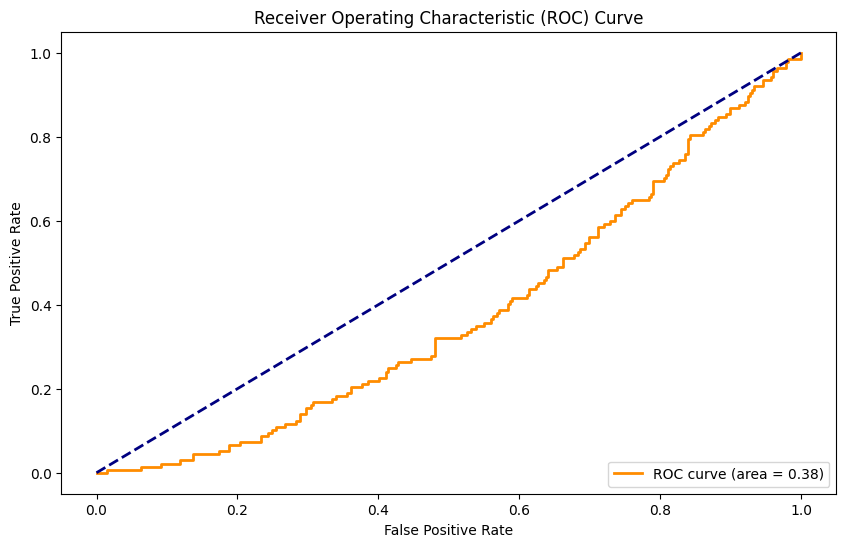

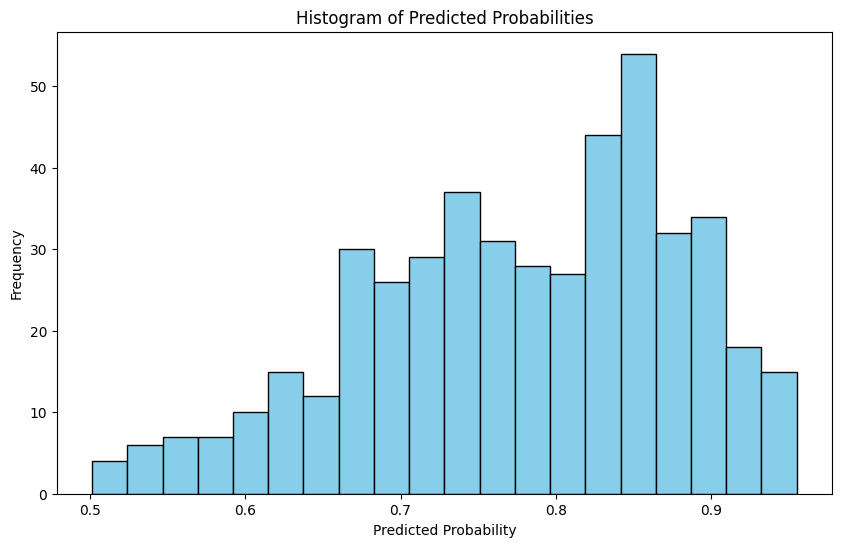


Analysis and Interpretation:
- The accuracy of 0.7039 indicates the proportion of correct predictions.
- The F1 score of 0.0282 suggests a balanced performance in precision and recall.
- The ROC-AUC score of 0.3791 shows the model's ability to discriminate between classes.
- The ROC curve visualizes the trade-off between true positive and false positive rates.
- The histogram of predicted probabilities reveals the confidence of predictions, which can be useful for threshold analysis.
CPU times: user 1min 24s, sys: 24.6 s, total: 1min 48s
Wall time: 2min 17s


In [ ]:
%%time

# NOTE: 2m17s

from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, classification_report, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import matplotlib.pyplot as plt
import time
from tabpfn import TabPFNClassifier

# Preprocessing

# Start timer
start_time = time.time()

# Copy the DataFrame to avoid modifying the original
df_processed = df.copy()

# Drop non-informative columns based on metadata
# columns_to_drop = ['short_text_summary', 'long_text_summary']  # Example: Text-based columns
# df_processed = df_processed.drop(columns=columns_to_drop)

# Convert categorical columns to numeric using LabelEncoder
categorical_columns = df_processed.select_dtypes(include=['object']).columns
encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df_processed[col] = le.fit_transform(df_processed[col])
    encoders[col] = le

# Convert binary columns to integers (if needed)
binary_columns = df_processed.select_dtypes(include=['bool']).columns
df_processed[binary_columns] = df_processed[binary_columns].astype(int)

# Ensure all columns are numeric
assert df_processed.select_dtypes(exclude=['number']).empty, "All columns must be numeric."

# Split features and target
X = df_processed.drop(columns=['arrestedafter2002'])  # Replace with actual target column name
y = df_processed['arrestedafter2002']  # Target column

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Initialize and train TabPFNClassifier
classifier = TabPFNClassifier(device='cpu', N_ensemble_configurations=32)
classifier.fit(X_train, y_train)

# Predictions and probabilities
y_eval, p_eval = classifier.predict(X_test, return_winning_probability=True)

# Stop timer
elapsed_time = time.time() - start_time

# Performance metrics
accuracy = accuracy_score(y_test, y_eval)
f1 = f1_score(y_test, y_eval)
roc_auc = roc_auc_score(y_test, p_eval)

print("Performance Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")
print(f"Total Elapsed Time: {elapsed_time:.2f} seconds")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_eval))

# Visualizations
# 1. ROC Curve
fpr, tpr, _ = roc_curve(y_test, p_eval)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

# 2. Histogram of Predicted Probabilities
plt.figure(figsize=(10, 6))
plt.hist(p_eval, bins=20, color='skyblue', edgecolor='black')
plt.title("Histogram of Predicted Probabilities")
plt.xlabel("Predicted Probability")
plt.ylabel("Frequency")
plt.show()

# Analysis and Interpretation
print("\nAnalysis and Interpretation:")
print(f"- The accuracy of {accuracy:.4f} indicates the proportion of correct predictions.")
print(f"- The F1 score of {f1:.4f} suggests a balanced performance in precision and recall.")
print(f"- The ROC-AUC score of {roc_auc:.4f} shows the model's ability to discriminate between classes.")
print(f"- The ROC curve visualizes the trade-off between true positive and false positive rates.")
print(f"- The histogram of predicted probabilities reveals the confidence of predictions, which can be useful for threshold analysis.")


## TabLLM

# Generic LLMs

## Prompts

* [LLM Prompt Library](https://github.com/abilzerian/LLM-Prompt-Library)

## Commercial SOTA LLMs

### OpenAI: o1

### OpenAI: gpt4

### Anthropic: Claude 3.5

## Open LLMs

### Meta Lllama 3.3 (3 sizes x 2 quantizations)

### Microsoft Phi-3

### QwQ

### Qwen 2.5

### marco-o1

### tulu3

# END